In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objs as go
import numpy as np
import warnings
import plotly.graph_objects as go
warnings.filterwarnings("ignore")

In [2]:
pd.set_option('display.max_rows', None)  # None means unlimited rows
pd.set_option('display.max_columns', None)

In [3]:
df=pd.read_csv('raw_data/col_mat_nuw_output.csv',header=None)
print(df.shape)
df.head(10)

(5478, 4)


,0,1,2,3
0,0.000197,Colombo Proper,2019-01-01,2019-01-02
1,0.000263,Colombo Proper,2019-01-02,2019-01-03
2,0.000099,Colombo Proper,2019-01-03,2019-01-04
3,0.000210,Colombo Proper,2019-01-04,2019-01-05
4,0.000179,Colombo Proper,2019-01-05,2019-01-06
5,0.000108,Colombo Proper,2019-01-06,2019-01-07
6,0.000393,Colombo Proper,2019-01-07,2019-01-08
7,0.000092,Colombo Proper,2019-01-08,2019-01-09
8,0.000121,Colombo Proper,2019-01-09,2019-01-10
9,0.000130,Colombo Proper,2019-01-10,2019-01-11


In [4]:
column_names=['HCHO_reading', 'Location', 'Current_Date', 'Next_Date']
df.columns=column_names
df.head(10)

,HCHO_reading,Location,Current_Date,Next_Date
0,0.000197,Colombo Proper,2019-01-01,2019-01-02
1,0.000263,Colombo Proper,2019-01-02,2019-01-03
2,0.000099,Colombo Proper,2019-01-03,2019-01-04
3,0.000210,Colombo Proper,2019-01-04,2019-01-05
4,0.000179,Colombo Proper,2019-01-05,2019-01-06
5,0.000108,Colombo Proper,2019-01-06,2019-01-07
6,0.000393,Colombo Proper,2019-01-07,2019-01-08
7,0.000092,Colombo Proper,2019-01-08,2019-01-09
8,0.000121,Colombo Proper,2019-01-09,2019-01-10
9,0.000130,Colombo Proper,2019-01-10,2019-01-11


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5478 entries, 0 to 5477
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   HCHO_reading  3059 non-null   float64
 1   Location      5478 non-null   object 
 2   Current_Date  5478 non-null   object 
 3   Next_Date     5478 non-null   object 
dtypes: float64(1), object(3)
memory usage: 171.3+ KB


In [6]:
try:
    # Convert 'Current_Date' to DateTime format
    df['Current_Date'] = pd.to_datetime(df['Current_Date'])
    print("Conversion to DateTime format successful.")
except ValueError as e:
    print(f"Error converting to DateTime format: {e}")

Conversion to DateTime format successful.


In [7]:
try:
    # Convert 'Current_Date' to DateTime format
    df['Next_Date'] = pd.to_datetime(df['Next_Date'])
    print("Conversion to DateTime format successful.")
except ValueError as e:
    print(f"Error converting to DateTime format: {e}")

Conversion to DateTime format successful.


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5478 entries, 0 to 5477
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   HCHO_reading  3059 non-null   float64       
 1   Location      5478 non-null   object        
 2   Current_Date  5478 non-null   datetime64[ns]
 3   Next_Date     5478 non-null   datetime64[ns]
dtypes: datetime64[ns](2), float64(1), object(1)
memory usage: 171.3+ KB


In [9]:
df['Location'].value_counts()

Location
Colombo Proper         1826
Deniyaya, Matara       1826
Nuwara Eliya Proper    1826
Name: count, dtype: int64

In [10]:
cmb=df[df['Location']=='Colombo Proper']
mtr=df[df['Location']=='Deniyaya, Matara']
ne=df[df['Location']=='Nuwara Eliya Proper']

In [11]:
print(cmb['Location'].value_counts())
cmb.head(10)

Location
Colombo Proper    1826
Name: count, dtype: int64


,HCHO_reading,Location,Current_Date,Next_Date
0,0.000197,Colombo Proper,2019-01-01,2019-01-02
1,0.000263,Colombo Proper,2019-01-02,2019-01-03
2,0.000099,Colombo Proper,2019-01-03,2019-01-04
3,0.000210,Colombo Proper,2019-01-04,2019-01-05
4,0.000179,Colombo Proper,2019-01-05,2019-01-06
5,0.000108,Colombo Proper,2019-01-06,2019-01-07
6,0.000393,Colombo Proper,2019-01-07,2019-01-08
7,0.000092,Colombo Proper,2019-01-08,2019-01-09
8,0.000121,Colombo Proper,2019-01-09,2019-01-10
9,0.000130,Colombo Proper,2019-01-10,2019-01-11


In [12]:
print(mtr['Location'].value_counts())
mtr.head(10)

Location
Deniyaya, Matara    1826
Name: count, dtype: int64


,HCHO_reading,Location,Current_Date,Next_Date
1826,NaN,"Deniyaya, Matara",2019-01-01,2019-01-02
1827,0.000006,"Deniyaya, Matara",2019-01-02,2019-01-03
1828,0.000236,"Deniyaya, Matara",2019-01-03,2019-01-04
1829,0.000064,"Deniyaya, Matara",2019-01-04,2019-01-05
1830,0.000053,"Deniyaya, Matara",2019-01-05,2019-01-06
1831,0.000132,"Deniyaya, Matara",2019-01-06,2019-01-07
1832,0.000063,"Deniyaya, Matara",2019-01-07,2019-01-08
1833,0.000023,"Deniyaya, Matara",2019-01-08,2019-01-09
1834,NaN,"Deniyaya, Matara",2019-01-09,2019-01-10
1835,0.000072,"Deniyaya, Matara",2019-01-10,2019-01-11


In [13]:
print(ne['Location'].value_counts())
ne.head(10)

Location
Nuwara Eliya Proper    1826
Name: count, dtype: int64


,HCHO_reading,Location,Current_Date,Next_Date
3652,NaN,Nuwara Eliya Proper,2019-01-01,2019-01-02
3653,NaN,Nuwara Eliya Proper,2019-01-02,2019-01-03
3654,0.000191,Nuwara Eliya Proper,2019-01-03,2019-01-04
3655,0.000051,Nuwara Eliya Proper,2019-01-04,2019-01-05
3656,0.000065,Nuwara Eliya Proper,2019-01-05,2019-01-06
3657,0.000090,Nuwara Eliya Proper,2019-01-06,2019-01-07
3658,0.000041,Nuwara Eliya Proper,2019-01-07,2019-01-08
3659,NaN,Nuwara Eliya Proper,2019-01-08,2019-01-09
3660,NaN,Nuwara Eliya Proper,2019-01-09,2019-01-10
3661,NaN,Nuwara Eliya Proper,2019-01-10,2019-01-11


## "Colombo proper" preprocessing

In [14]:
cmb.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1826 entries, 0 to 1825
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   HCHO_reading  1339 non-null   float64       
 1   Location      1826 non-null   object        
 2   Current_Date  1826 non-null   datetime64[ns]
 3   Next_Date     1826 non-null   datetime64[ns]
dtypes: datetime64[ns](2), float64(1), object(1)
memory usage: 71.3+ KB


In [15]:
cmb.describe()

,HCHO_reading,Current_Date,Next_Date
count,1339.000000,1826,1826
mean,0.000159,2021-07-01 12:00:00,2021-07-02 12:00:00.000000256
min,-0.000229,2019-01-01 00:00:00,2019-01-02 00:00:00
25%,0.000093,2020-04-01 06:00:00,2020-04-02 06:00:00
50%,0.000151,2021-07-01 12:00:00,2021-07-02 12:00:00
75%,0.000221,2022-09-30 18:00:00,2022-10-01 18:00:00
max,0.000650,2023-12-31 00:00:00,2024-01-01 00:00:00
std,0.000099,NaN,NaN


In [16]:
# Step 1: Check Time Range
min_date = cmb['Current_Date'].min()
max_date = cmb['Current_Date'].max()
print("Time Range: From", min_date, "to", max_date)

# Step 2: Generate Time Range
complete_time_range = pd.date_range(start=min_date, end=max_date, freq='D')  
# Step 3: Identify Missing Values
missing_values = complete_time_range[~complete_time_range.isin(df['Current_Date'])]

if len(missing_values) == 0:
    print("No missing dates found in the time range.")
else:
    print("Missing values found:")
    print(missing_values)


Time Range: From 2019-01-01 00:00:00 to 2023-12-31 00:00:00
No missing dates found in the time range.


In [17]:
cmb.set_index('Current_Date', inplace=True)

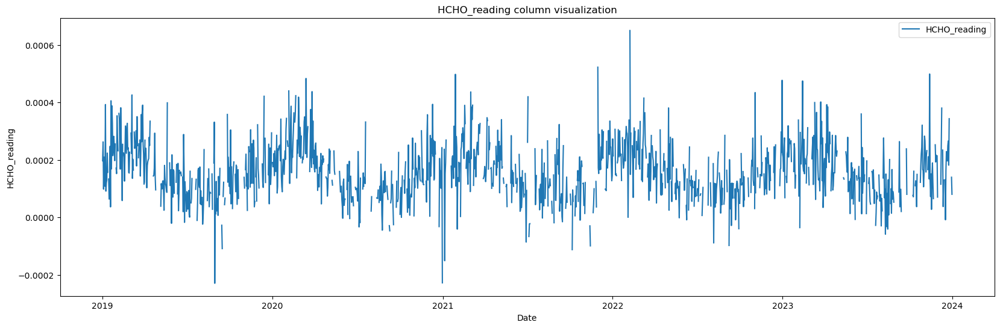

In [18]:
# Create the plot
plt.figure(figsize=(20, 6))
plt.plot( cmb.index, cmb["HCHO_reading"], label="HCHO_reading")
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

In [19]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=cmb.index, y=cmb['HCHO_reading'], mode='lines', name='HCHO_reading'))

# Update layout
fig.update_layout(title='HCHO-level Data',
                  xaxis_title='Date',
                  yaxis_title='HCHO-level',
                  xaxis=dict(rangeslider=dict(visible=True), type='date'))

# Show the plot
fig.show()

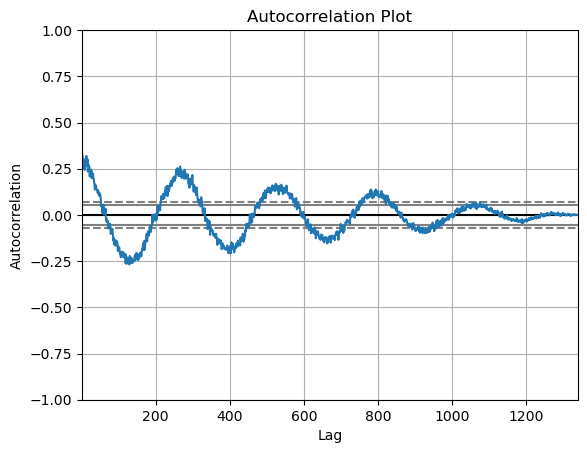

In [20]:
pd.plotting.autocorrelation_plot(cmb[['HCHO_reading']].dropna())
plt.title('Autocorrelation Plot')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()


# Null Value treatment
### Let's try to identify how null values are distributed through out the dataset.

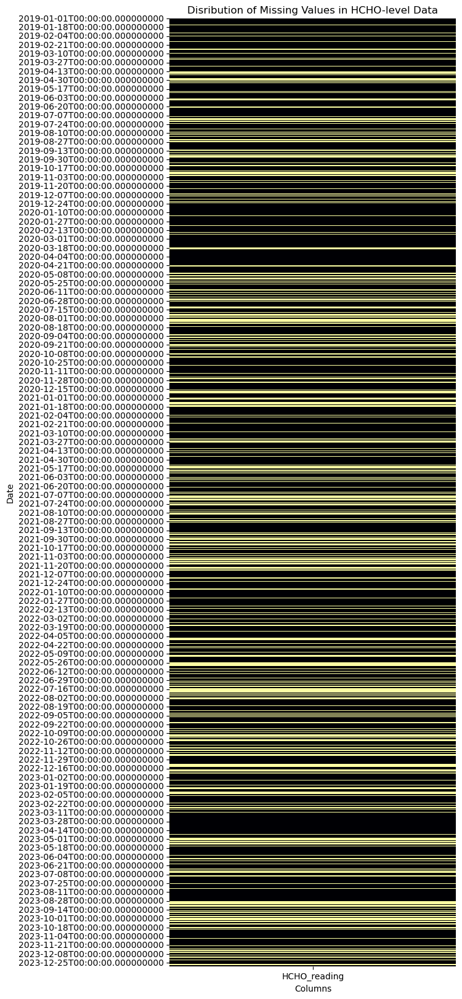

In [21]:
# Visualize missing values using a heatmap
plt.figure(figsize=(6, 20))
sns.heatmap(cmb[['HCHO_reading']].isnull(), cbar=False, cmap='inferno')
plt.title('Disribution of Missing Values in HCHO-level Data')
plt.xlabel('Columns')
plt.ylabel('Date')
plt.show()

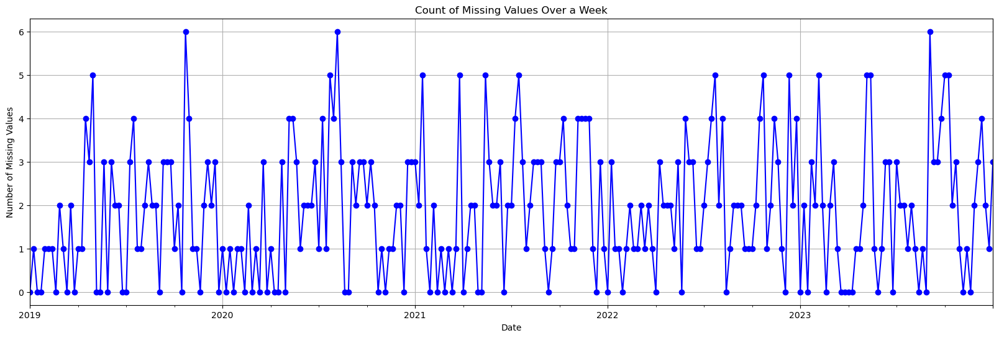

In [22]:
frequency = 'W'

missing_counts = cmb[['HCHO_reading']].isnull().sum(axis=1).resample(frequency).sum()
# Plot the count of missing values over time
plt.figure(figsize=(20, 6))
missing_counts.plot(color='blue', marker='o', linestyle='-')
plt.title('Count of Missing Values Over a Week')
plt.xlabel('Date')
plt.ylabel('Number of Missing Values')
plt.grid(True)
plt.show()

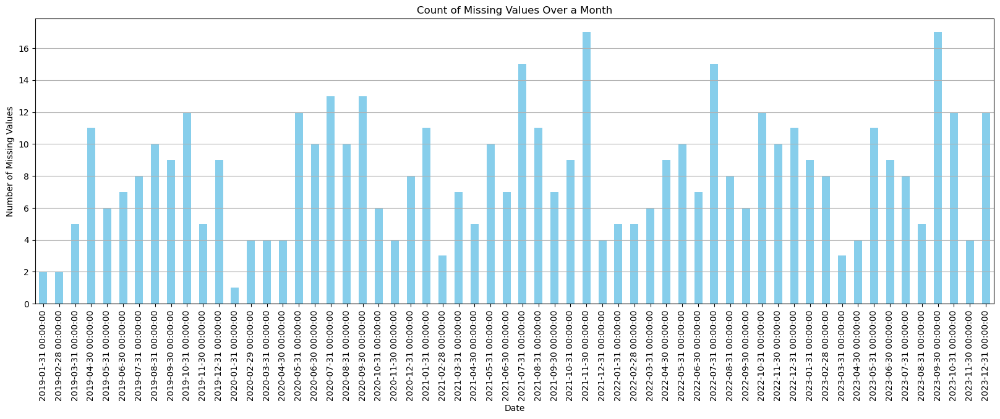

In [23]:
frequency = 'M'

missing_counts = cmb[['HCHO_reading']].isnull().sum(axis=1).resample(frequency).sum()

# Plot the count of missing values over time as a bar chart
plt.figure(figsize=(20, 6))
missing_counts.plot(kind='bar', color='skyblue')
plt.title('Count of Missing Values Over a Month')
plt.xlabel('Date')
plt.ylabel('Number of Missing Values')
plt.grid(axis='y')  # Display gridlines only along the y-axis
plt.show()


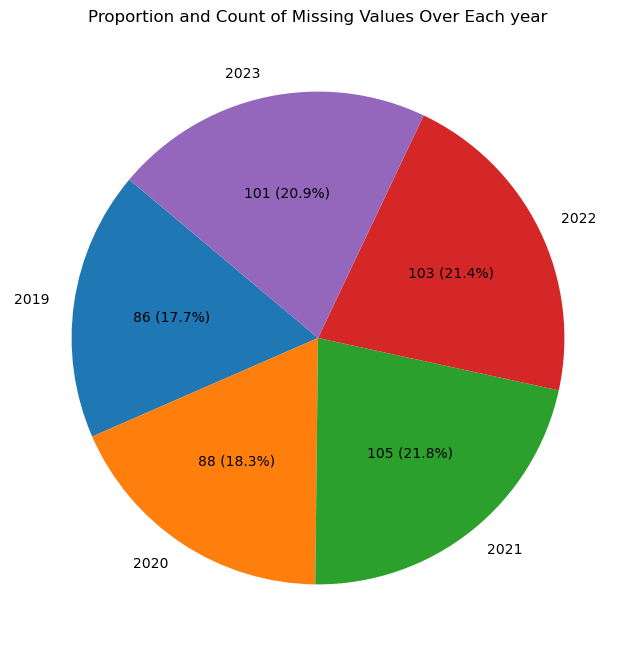

In [24]:
frequency = 'Y'

missing_counts = cmb[['HCHO_reading']].isnull().sum(axis=1).resample(frequency).sum()

# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(missing_counts, labels=missing_counts.index.year, autopct=lambda p: f'{int(p * sum(missing_counts)/100)} ({p:.1f}%)', startangle=140)
plt.title('Proportion and Count of Missing Values Over Each year')
plt.show()


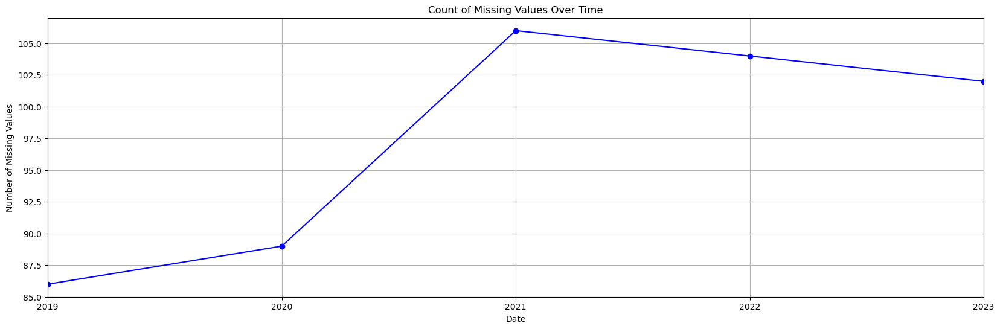

In [25]:
frequency = 'Y'

missing_counts = cmb[['HCHO_reading']].isnull().sum(axis=1).resample(frequency).sum()
# Plot the count of missing values over time
plt.figure(figsize=(20, 6))
missing_counts.plot(color='blue', marker='o', linestyle='-')
plt.title('Count of Missing Values Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Missing Values')
plt.grid(True)
plt.show()

# Null Value treatment using Global Mean imputation

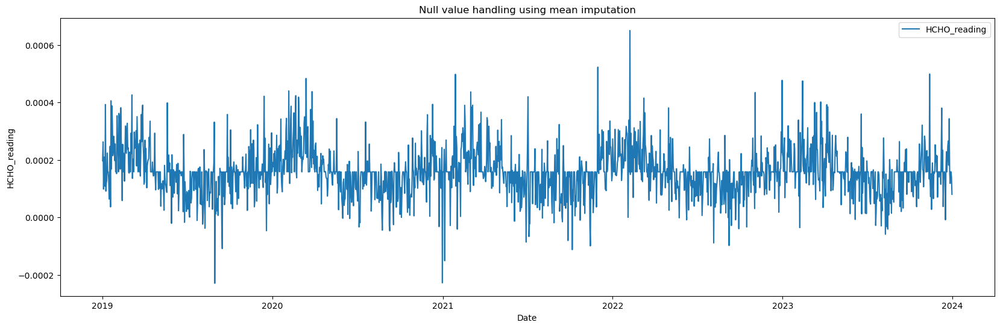

In [26]:
cmb['Mean_imputation']=cmb['HCHO_reading'].fillna(cmb['HCHO_reading'].mean())
plt.figure(figsize=(20, 6))
plt.plot( cmb.index, cmb["Mean_imputation"], label="HCHO_reading")
plt.title("Null value handling using mean imputation")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

# Null Value treatment using Rolling window method 3,7,30

![Alt Text](r olling_window.png)

<img src="rolling_window.png" alt="Alt Text" width="500"/>

https://medium.com/@aaabulkhair/data-imputation-demystified-time-series-data-69bc9c798cb7
https://medium.com/towards-data-science/handling-gaps-in-time-series-dc47ae883990

## Method 1
## A method to fill null values using rolling window mean technique

In [27]:
#Rolling window method with window size-2 on a loop untill number of null values become 0
def rolling_window(size,df):
    df[f'rolling_{size}']=df['HCHO_reading']
    num=0
    while (df[f'rolling_{size}'].isnull().sum()>0):
        num+=1
        df[f'rolling_{size}']=df[f'rolling_{size}'].fillna(df[f'rolling_{size}'].rolling(window=size, min_periods=1).mean())
    plt.figure(figsize=(20, 6))
    plt.plot( df.index, df[f"rolling_{size}"], label=f"rolling_{size}")
    plt.title("HCHO_reading column visualization")
    plt.xlabel("Date")
    plt.ylabel("HCHO_reading")
    plt.legend()
    plt.show()
    print('num of iterations, ',num)

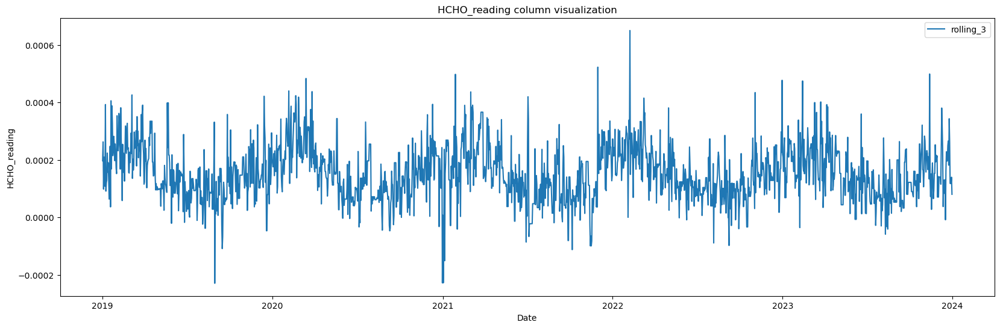

num of iterations,  4


In [28]:
rolling_window(3,cmb)

## Method 2

## This method fills null values in the 'HCHO_reading_filled' column by taking the mean of non-null values for the same day across different years and then applying a rolling window mean. 

## This method aims to fill null values by leveraging the temporal pattern of the data, specifically by using the mean of non-null values for the same day across different years. Additionally, it applies a rolling window mean to further smooth the filled values and potentially capture any remaining fluctuations in the data.

Previous: 487
After: 136


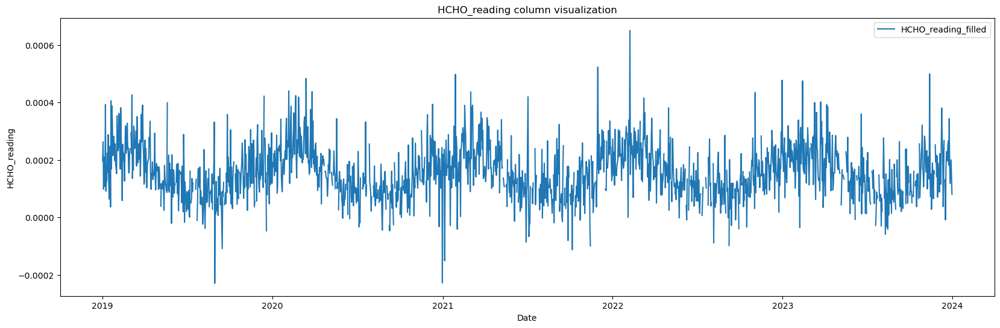

Previous: 136
After: 0


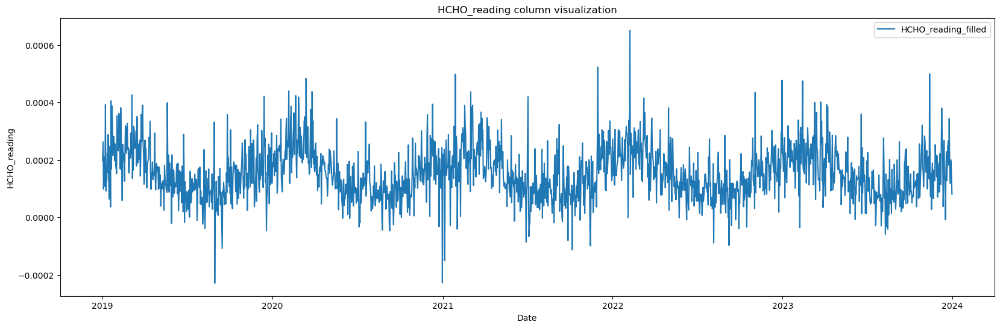

In [29]:
cmb['HCHO_reading_filled'] = cmb['HCHO_reading']

# Define the time range
start_date = '2019-01-01'
end_date = '2024-01-01'

# Generate a DataFrame with the range of dates
date_range = pd.date_range(start=start_date, end=end_date, freq='D')



# Iterate over each null value
for index, row in cmb[cmb['HCHO_reading_filled'].isnull()].iterrows():
    # Get the date of the null value
    null_date = row.name
    
    # Extract the month and day of the null date
    month_day = (null_date.month, null_date.day)
    
    # Filter the DataFrame to include only rows with the same month and day
    same_day_rows = cmb[(cmb.index.month == month_day[0]) & (cmb.index.day == month_day[1])]
    
    if same_day_rows['HCHO_reading_filled'].isnull().sum()<3:
    
        # Exclude the null value itself
        same_day_rows = same_day_rows[same_day_rows.index != null_date]

        # Calculate the mean of the non-null values for the same day across years
        mean_value = same_day_rows['HCHO_reading_filled'].mean()

        # Fill the null value with the mean
        cmb.at[null_date, 'HCHO_reading_filled'] = mean_value
        
print('Previous:', cmb['HCHO_reading'].isnull().sum())
print('After:' ,cmb['HCHO_reading_filled'].isnull().sum())

# Display the DataFrame with the filled values
plt.figure(figsize=(20, 6))
plt.plot(cmb.index, cmb['HCHO_reading_filled'], label='HCHO_reading_filled')
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

print('Previous:', cmb['HCHO_reading_filled'].isnull().sum())
cmb['HCHO_reading_filled']=cmb['HCHO_reading_filled'].fillna(cmb['HCHO_reading_filled'].rolling(window=4, min_periods=1).mean())
print('After:' ,cmb['HCHO_reading_filled'].isnull().sum())

# Display the DataFrame with the filled values
plt.figure(figsize=(20, 6))
plt.plot(cmb.index, cmb['HCHO_reading_filled'], label='HCHO_reading_filled')
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

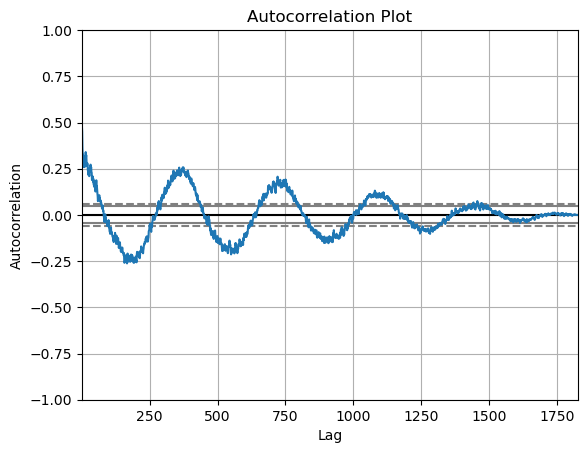

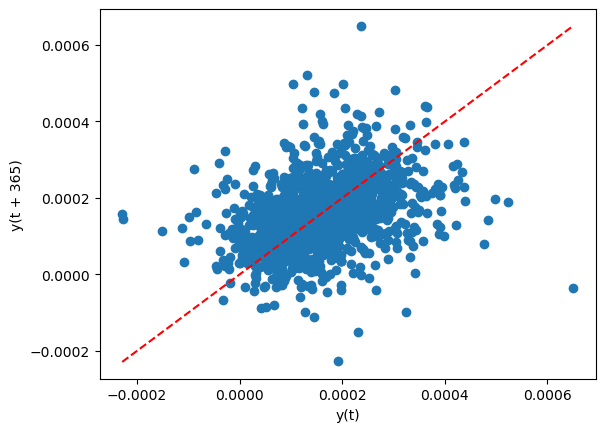

In [30]:
pd.plotting.autocorrelation_plot(cmb[['rolling_3']])
plt.title('Autocorrelation Plot')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

# Create the lag plot
lag_plot = pd.plotting.lag_plot(cmb[['HCHO_reading_filled']].dropna(), lag=365)

# Add y=x line
plt.plot([cmb['HCHO_reading_filled'].min(), cmb['HCHO_reading_filled'].max()],
         [cmb['HCHO_reading_filled'].min(), cmb['HCHO_reading_filled'].max()],
         linestyle='--', color='red')

plt.show()


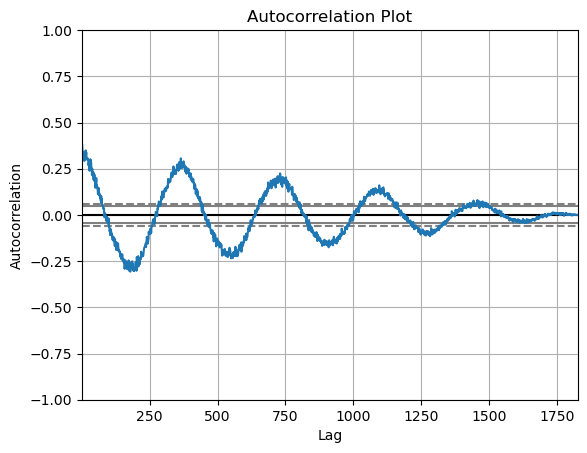

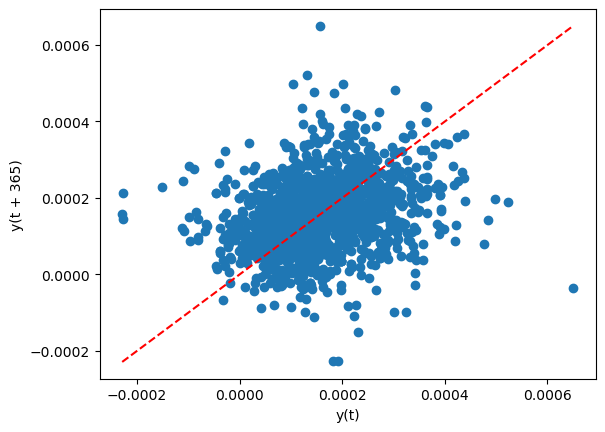

In [31]:
pd.plotting.autocorrelation_plot(cmb[['HCHO_reading_filled']])
plt.title('Autocorrelation Plot')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()


# Create the lag plot
lag_plot = pd.plotting.lag_plot(cmb[['rolling_3']].dropna(), lag=365)

# Add y=x line
plt.plot([cmb['HCHO_reading_filled'].min(), cmb['HCHO_reading_filled'].max()],
         [cmb['HCHO_reading_filled'].min(), cmb['HCHO_reading_filled'].max()],
         linestyle='--', color='red')

plt.show()

## Second method has captured the seasonality slightly better. So it will be chose over the 1st method

## Other methods

## interpolation linear, spline

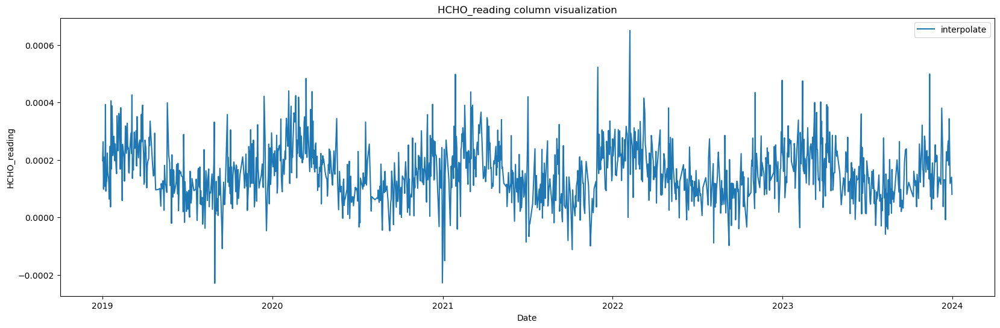

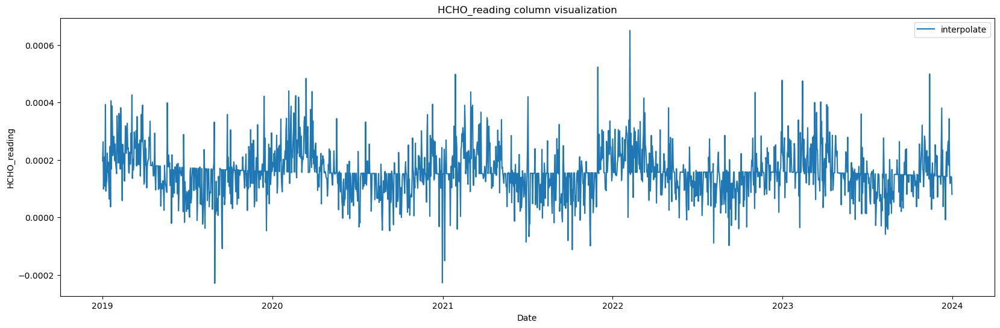

In [32]:
#Linear interpolation
cmb['linear_interpolate']=cmb['HCHO_reading'].interpolate(method='linear')
#Spline interpolation
cmb['spline_interpolate']=cmb['HCHO_reading'].interpolate(method='spline',order=3)

plt.figure(figsize=(20, 6))
plt.plot( cmb.index, cmb["linear_interpolate"], label="interpolate")
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

plt.figure(figsize=(20, 6))
plt.plot( cmb.index, cmb["spline_interpolate"], label="interpolate")
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

In [33]:
# import plotly.graph_objs as go

# #cmb.set_index('Current_Date', inplace=True)
# fig = go.Figure()
# fig.add_trace(go.Scatter(x=cmb.index, y=cmb['HCHO_reading'].fillna(0), mode='lines', name='HCHO_reading'))
# fig.add_trace(go.Scatter(x=cmb.index, y=cmb['rolling_3'], mode='lines', name='rolling_3'))
# fig.add_trace(go.Scatter(x=cmb.index, y=cmb['linear_interpolate'], mode='lines', name='linear_interpolate'))
# #fig.add_trace(go.Scatter(x=cmb.index, y=cmb['rolling_30'], mode='lines', name='rolling_30'))

# # Update layout
# fig.update_layout(title='HCHO-level Data',
#                   xaxis_title='Date',
#                   yaxis_title='HCHO-level',
#                   xaxis=dict(rangeslider=dict(visible=True), type='date'))

# # Show the plot
# fig.show()

# Foward Fill and Backward fill methods

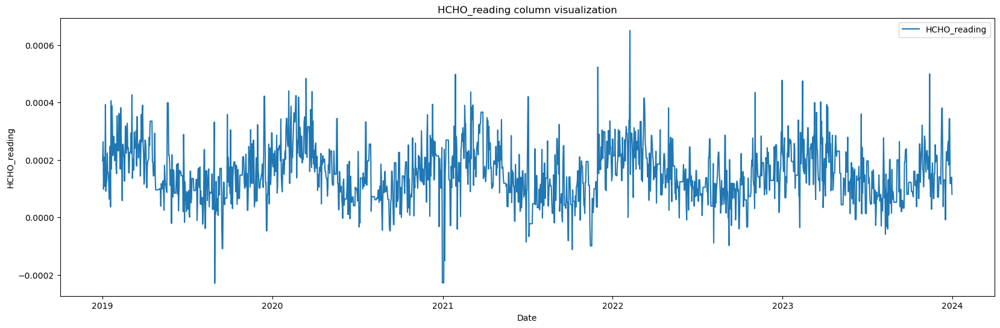

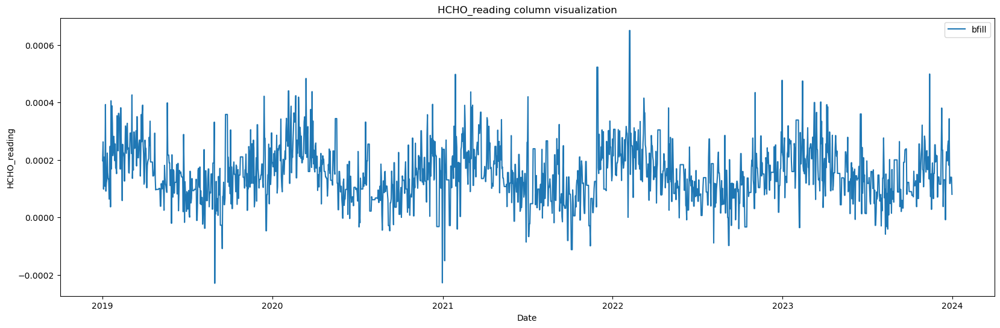

In [34]:
cmb['ffill']=cmb['HCHO_reading'].fillna(method='ffill')
cmb['bfill']=cmb['HCHO_reading'].fillna(method="bfill")

plt.figure(figsize=(20, 6))
plt.plot( cmb.index, cmb["ffill"], label="HCHO_reading")
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

plt.figure(figsize=(20, 6))
plt.plot( cmb.index, cmb["bfill"], label="bfill")
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

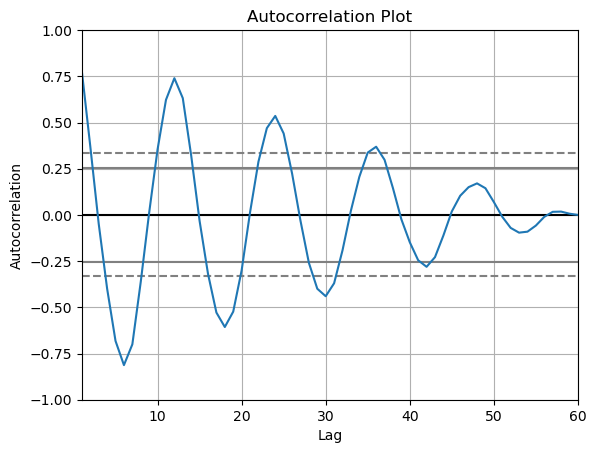

In [35]:
pd.plotting.autocorrelation_plot(cmb[['HCHO_reading_filled']].resample('1m').mean())
plt.title('Autocorrelation Plot')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

## Trying to get a visual intuition of how different null value handling techniques performed

In [36]:

import pandas as pd

# Convert index to datetime if it's not already
cmb.index = pd.to_datetime(cmb.index)

# Fill null values with NaN to preserve their distinction
cmb_filled = cmb['HCHO_reading'].fillna(float('nan'))

# Create a mask for null values
null_mask = cmb_filled.isnull()

# Create traces for data with null values marked
fig = go.Figure()
fig.add_trace(go.Scatter(x=cmb.index, y=cmb_filled.where(~null_mask), mode='lines', name='HCHO_reading'))
fig.add_trace(go.Scatter(x=cmb.index, y=cmb['rolling_3'], mode='lines', name='rolling_3'))
fig.add_trace(go.Scatter(x=cmb.index, y=cmb['HCHO_reading_filled'], mode='lines', name='HCHO_reading_filled'))
fig.add_trace(go.Scatter(x=cmb.index, y=cmb['linear_interpolate'], mode='lines', name='linear_interpolate'))
fig.add_trace(go.Scatter(x=cmb.index, y=cmb['spline_interpolate'], mode='lines', name='spline_interpolate'))
fig.add_trace(go.Scatter(x=cmb.index, y=cmb['ffill'], mode='lines', name='ffil'))
fig.add_trace(go.Scatter(x=cmb.index, y=cmb['bfill'], mode='lines', name='bfill'))

# Add markers for null values
fig.add_trace(go.Scatter(x=cmb.index[null_mask], y=[0] * null_mask.sum(),
                         mode='markers', marker=dict(color='red', symbol='circle-open', size=10),
                         name='Null values'))

# Update layout
fig.update_layout(title='HCHO-level Data',
                  xaxis_title='Date',
                  yaxis_title='HCHO-level',
                  xaxis=dict(rangeslider=dict(visible=True), type='date'),
                  # Set x-axis range based on minimum and maximum dates in the dataset
                  xaxis_range=[cmb.index.min(), cmb.index.max()],
                  # Set rangeslider range explicitly to match x-axis range
                  xaxis_rangeslider=dict(range=[cmb.index.min(), cmb.index.max()]))

# Show the plot
fig.show()


In [37]:
cmb.describe()

,HCHO_reading,Next_Date,Mean_imputation,rolling_3,HCHO_reading_filled,linear_interpolate,spline_interpolate,ffill,bfill
count,1339.000000,1826,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000,1826.000000
mean,0.000159,2021-07-02 12:00:00.000000256,0.000159,0.000153,0.000154,0.000154,0.000158,0.000154,0.000153
min,-0.000229,2019-01-02 00:00:00,-0.000229,-0.000229,-0.000229,-0.000229,-0.000229,-0.000229,-0.000229
25%,0.000093,2020-04-02 06:00:00,0.000118,0.000089,0.000092,0.000092,0.000118,0.000088,0.000090
50%,0.000151,2021-07-02 12:00:00,0.000159,0.000144,0.000146,0.000144,0.000155,0.000145,0.000144
75%,0.000221,2022-10-01 18:00:00,0.000192,0.000213,0.000210,0.000211,0.000192,0.000214,0.000211
max,0.000650,2024-01-01 00:00:00,0.000650,0.000650,0.000650,0.000650,0.000650,0.000650,0.000650
std,0.000099,NaN,0.000085,0.000097,0.000092,0.000094,0.000085,0.000100,0.000099


In [38]:
cmb.drop(columns=['HCHO_reading',
                  'Mean_imputation',
                  'rolling_3',
                  'linear_interpolate',
                  'spline_interpolate', 
                  'ffill',
                  'bfill'],inplace=True)
cmb.head(15)


,Location,Next_Date,HCHO_reading_filled
Current_Date,,,
2019-01-01,Colombo Proper,2019-01-02,0.000197
2019-01-02,Colombo Proper,2019-01-03,0.000263
2019-01-03,Colombo Proper,2019-01-04,0.000099
2019-01-04,Colombo Proper,2019-01-05,0.000210
2019-01-05,Colombo Proper,2019-01-06,0.000179
2019-01-06,Colombo Proper,2019-01-07,0.000108
2019-01-07,Colombo Proper,2019-01-08,0.000393
2019-01-08,Colombo Proper,2019-01-09,0.000092
2019-01-09,Colombo Proper,2019-01-10,0.000121


# Outlier detection

Outlier number 19


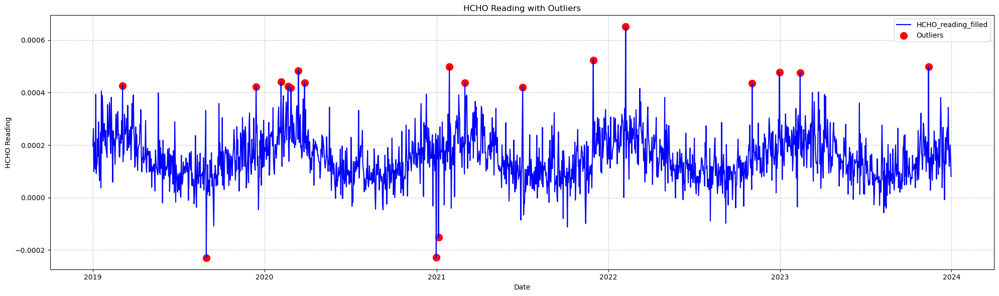

In [39]:
import numpy as np
import matplotlib.pyplot as plt

# Calculate the first and third quartiles
Q1 = np.percentile(cmb["HCHO_reading_filled"], 25)
Q3 = np.percentile(cmb["HCHO_reading_filled"], 75)
IQR = Q3 - Q1

threshold = 1.75 * IQR

# Find the outliers
outliers = (cmb["HCHO_reading_filled"] < Q1 - threshold) | (cmb["HCHO_reading_filled"] > Q3 + threshold)
print('Outlier number',outliers.sum())

# Plot the data
plt.figure(figsize=(20, 6))

# Plot the main data
plt.plot(cmb.index, cmb["HCHO_reading_filled"], label="HCHO_reading_filled", color='blue')

# Plot outliers
plt.scatter(cmb.index[outliers], cmb["HCHO_reading_filled"][outliers], color='red', marker='o', s=100, label='Outliers')

# Add grid lines
plt.grid(True, linestyle='--', alpha=0.7)

plt.title("HCHO Reading with Outliers")
plt.xlabel("Date")
plt.ylabel("HCHO Reading")
plt.legend()
plt.tight_layout()
plt.show()


#### Setting the outlier values to null so we can fill them again with null value imputation

In [40]:
import numpy as np
cmb['outlier_cleaned']=cmb["HCHO_reading_filled"]
cmb['outlier_cleaned'][outliers]=np.nan
cmb['outlier_cleaned'].isnull().sum()

19

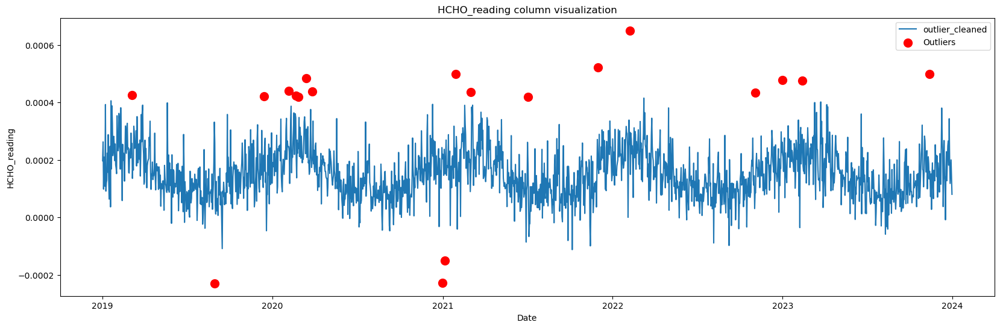

In [41]:
#Rolling window method with window size-3 on a loop untill number of null values become 0


while (cmb['outlier_cleaned'].isnull().sum()>0):
    cmb['outlier_cleaned']=cmb['outlier_cleaned'].fillna(cmb['outlier_cleaned'].rolling(window=3, min_periods=1).mean())
plt.figure(figsize=(20, 6))
plt.plot( cmb.index, cmb["outlier_cleaned"], label="outlier_cleaned")
plt.scatter(cmb.index[outliers], cmb["HCHO_reading_filled"][outliers], color='red', marker='o', s=100, label='Outliers')
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

In [42]:
cmb.rename(columns={'outlier_cleaned': 'HCHO_reading'}, inplace=True)

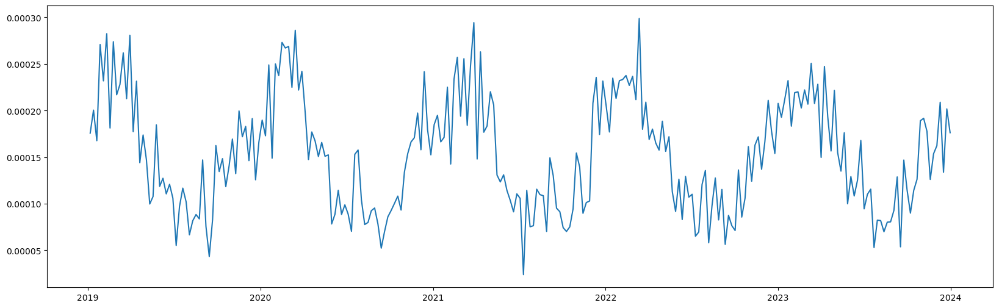

In [43]:
#cmb.groupby(cmb.index.year)

#cmb[['HCHO_reading']].resample('1w').mean()
plt.figure(figsize=(20, 6))
plt.plot(  cmb[['HCHO_reading']].resample('1w').mean(), label="outlier_cleaned")

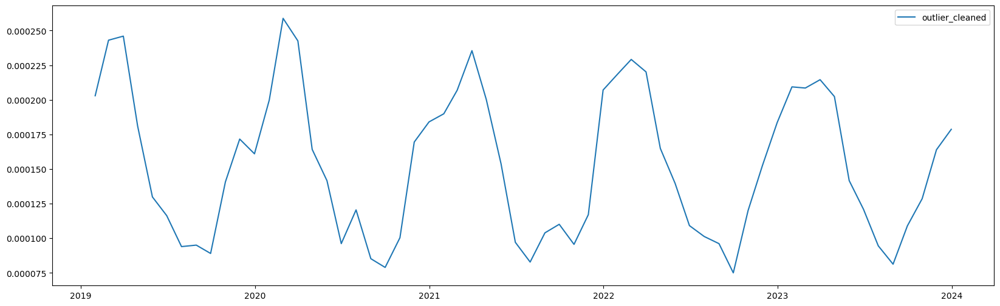

In [44]:
plt.figure(figsize=(20, 6))
#plt.plot(  cmb[['HCHO_reading']].resample('1m').mean(), label="HCHO_reading")
plt.plot(  cmb[['HCHO_reading']].resample('1m').mean(), label="outlier_cleaned")
plt.legend()
plt.show()

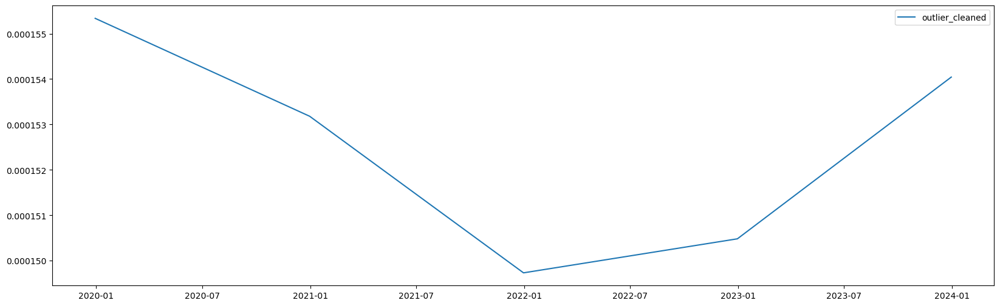

In [45]:
plt.figure(figsize=(20, 6))
#plt.plot(  cmb[['HCHO_reading']].resample('1y').mean(), label="HCHO_reading")
plt.plot(  cmb[['HCHO_reading']].resample('1y').mean(), label="outlier_cleaned")
plt.legend()
plt.show()

In [46]:
# import numpy as np
# import pandas as pd

# # Sample data
# d = ['HCHO_reading', 'Mean_imputation', 'rolling_3',
#        'rolling_7', 'rolling_30', 'linear_interpolate', 'spline_interpolate','outlier_cleaned']


# # Calculate the MSE between each pair of columns
# mse_matrix = np.zeros((len(d), len(d)))
# for i, col1 in enumerate(d):
#     for j, col2 in enumerate(d):
#         mse_matrix[i, j] = ((cmb[col1] - cmb[col2]) ** 2).mean()

# # Create a DataFrame from the MSE matrix
# mse_df = pd.DataFrame(mse_matrix, columns=d, index=d)
# mse_df


# Matara Deniyaya preprocessing

In [47]:
mtr.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1826 entries, 1826 to 3651
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   HCHO_reading  979 non-null    float64       
 1   Location      1826 non-null   object        
 2   Current_Date  1826 non-null   datetime64[ns]
 3   Next_Date     1826 non-null   datetime64[ns]
dtypes: datetime64[ns](2), float64(1), object(1)
memory usage: 71.3+ KB


In [48]:
mtr.describe()

,HCHO_reading,Current_Date,Next_Date
count,979.000000,1826,1826
mean,0.000092,2021-07-01 12:00:00,2021-07-02 12:00:00.000000256
min,-0.000259,2019-01-01 00:00:00,2019-01-02 00:00:00
25%,0.000037,2020-04-01 06:00:00,2020-04-02 06:00:00
50%,0.000081,2021-07-01 12:00:00,2021-07-02 12:00:00
75%,0.000139,2022-09-30 18:00:00,2022-10-01 18:00:00
max,0.000900,2023-12-31 00:00:00,2024-01-01 00:00:00
std,0.000097,NaN,NaN


In [49]:
# Step 1: Check Time Range
min_date = mtr['Current_Date'].min()
max_date = mtr['Current_Date'].max()
print("Time Range: From", min_date, "to", max_date)

# Step 2: Generate Time Range
complete_time_range = pd.date_range(start=min_date, end=max_date, freq='D')  
# Step 3: Identify Missing Values
missing_values = complete_time_range[~complete_time_range.isin(df['Current_Date'])]

if len(missing_values) == 0:
    print("No missing values found in the time range.")
else:
    print("Missing values found:")
    print(missing_values)


Time Range: From 2019-01-01 00:00:00 to 2023-12-31 00:00:00
No missing values found in the time range.


In [50]:
mtr.set_index('Current_Date', inplace=True)

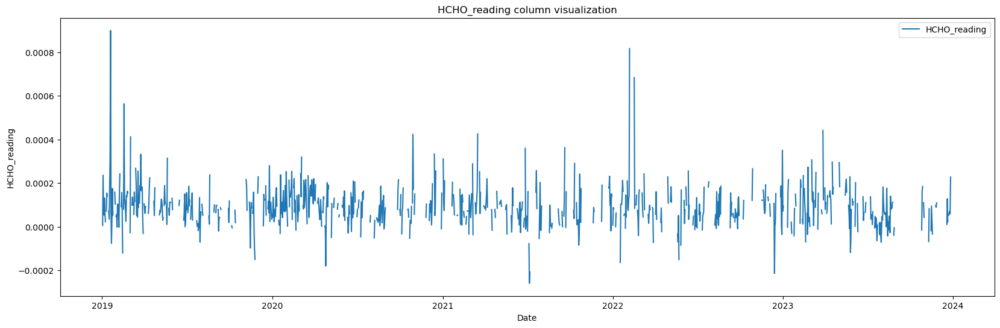

In [51]:
import matplotlib.pyplot as plt

# Create the plot
plt.figure(figsize=(20, 6))
plt.plot( mtr.index, mtr["HCHO_reading"], label="HCHO_reading")
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

In [52]:
import plotly.graph_objs as go


fig = go.Figure()


fig.add_trace(go.Scatter(x=mtr.index, y=mtr['HCHO_reading'], mode='lines', name='HCHO_reading'))

# Update layout
fig.update_layout(title='HCHO-level Data',
                  xaxis_title='Date',
                  yaxis_title='HCHO-level',
                  xaxis=dict(rangeslider=dict(visible=True), type='date'))

# Show the plot
fig.show()

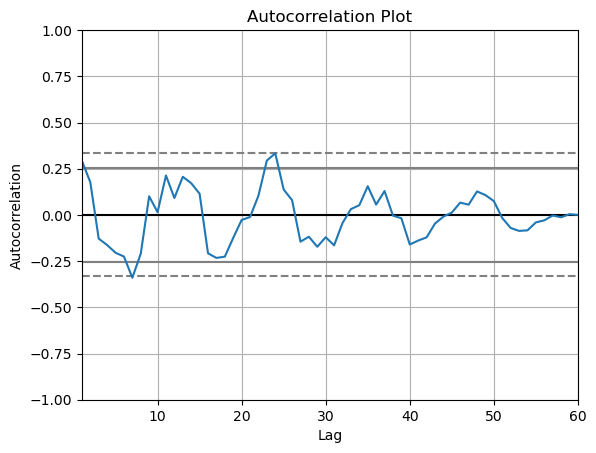

In [53]:
pd.plotting.autocorrelation_plot(mtr[['HCHO_reading']].dropna().resample('1m').mean())
plt.title('Autocorrelation Plot')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()


# Null Value treatment
### Let's try to identify how null values are distributed through out the dataset.

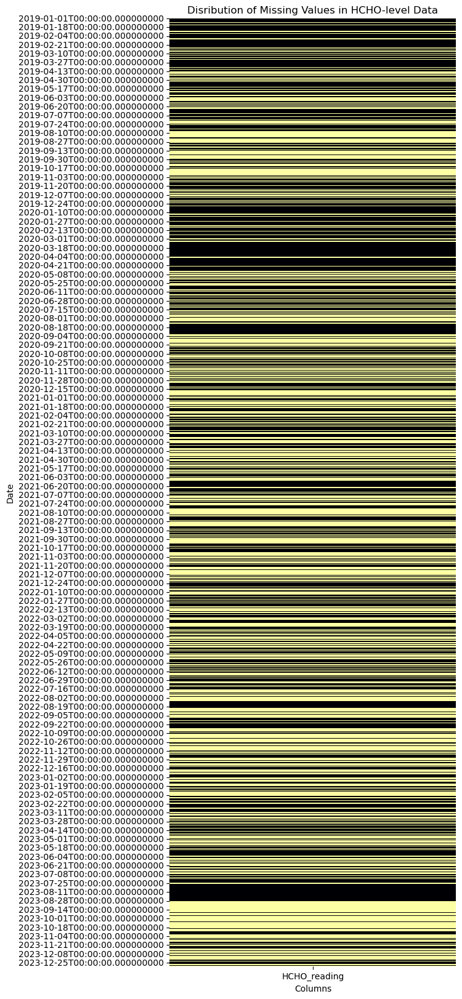

In [54]:
import seaborn as sns

# Visualize missing values using a heatmap
plt.figure(figsize=(6, 20))
sns.heatmap(mtr[['HCHO_reading']].isnull(), cbar=False, cmap='inferno')
plt.title('Disribution of Missing Values in HCHO-level Data')
plt.xlabel('Columns')
plt.ylabel('Date')
plt.show()

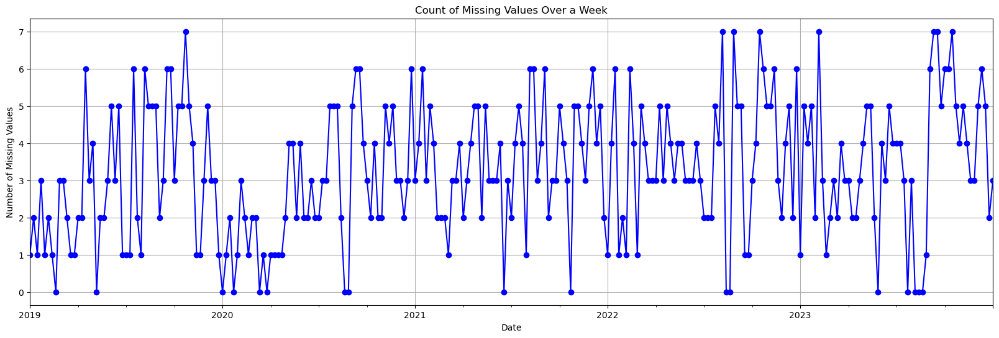

In [55]:
frequency = 'W'

missing_counts = mtr[['HCHO_reading']].isnull().sum(axis=1).resample(frequency).sum()
# Plot the count of missing values over time
plt.figure(figsize=(20, 6))
missing_counts.plot(color='blue', marker='o', linestyle='-')
plt.title('Count of Missing Values Over a Week')
plt.xlabel('Date')
plt.ylabel('Number of Missing Values')
plt.grid(True)
plt.show()

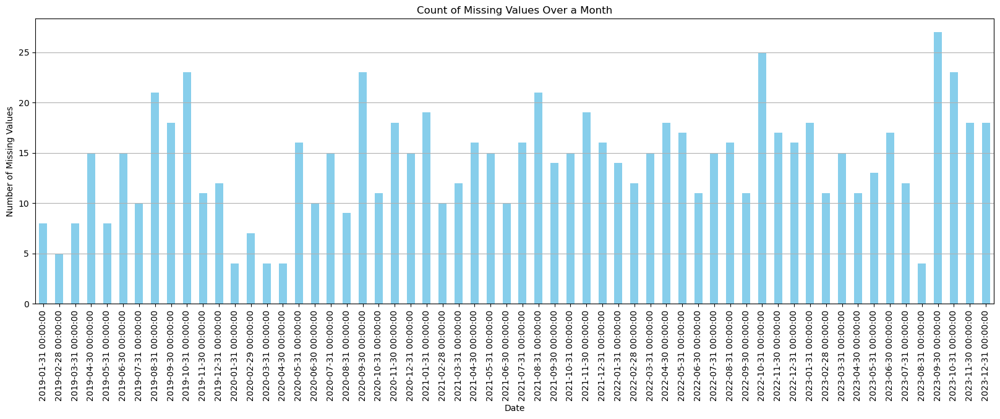

In [56]:
frequency = 'M'

missing_counts = mtr[['HCHO_reading']].isnull().sum(axis=1).resample(frequency).sum()

# Plot the count of missing values over time as a bar chart
plt.figure(figsize=(20, 6))
missing_counts.plot(kind='bar', color='skyblue')
plt.title('Count of Missing Values Over a Month')
plt.xlabel('Date')
plt.ylabel('Number of Missing Values')
plt.grid(axis='y')  # Display gridlines only along the y-axis
plt.show()


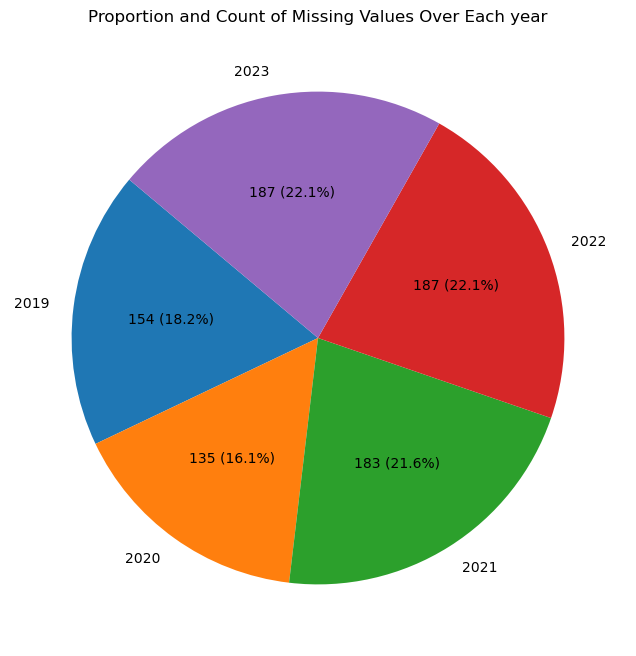

In [57]:
frequency = 'Y'

missing_counts = mtr[['HCHO_reading']].isnull().sum(axis=1).resample(frequency).sum()

# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(missing_counts, labels=missing_counts.index.year, autopct=lambda p: f'{int(p * sum(missing_counts)/100)} ({p:.1f}%)', startangle=140)
plt.title('Proportion and Count of Missing Values Over Each year')
plt.show()


# Rolling window method

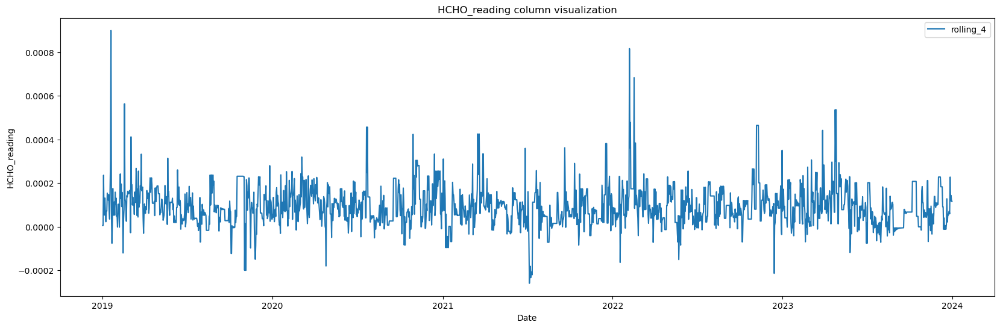

num of iterations,  7


In [58]:
size=4
mtr[f'rolling_{size}']=mtr['HCHO_reading']
num=0
while (mtr[f'rolling_{size}'].isnull().sum()>1):
    num+=1
    mtr[f'rolling_{size}']=mtr[f'rolling_{size}'].fillna(mtr[f'rolling_{size}'].rolling(window=size, min_periods=1).mean())
mtr[f'rolling_{size}']=mtr[f'rolling_{size}'].fillna(method='bfill')
plt.figure(figsize=(20, 6))
plt.plot( mtr.index, mtr[f"rolling_{size}"], label=f"rolling_{size}")
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()
print('num of iterations, ',num)

# Foward Fill and Backward fill methods

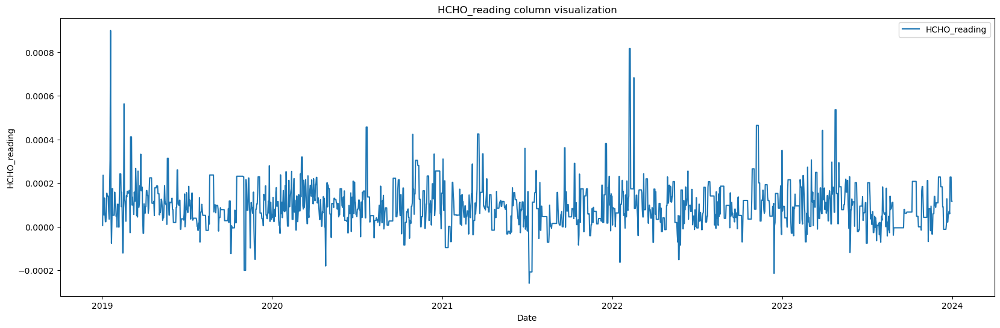

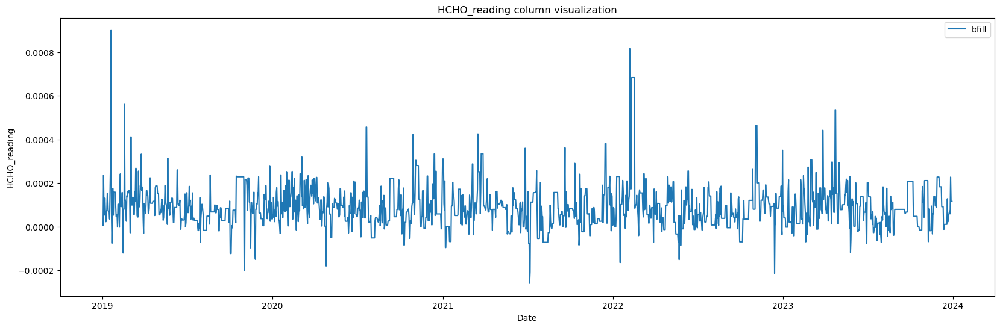

In [59]:
mtr['ffill']=mtr['HCHO_reading'].fillna(method='ffill')
plt.figure(figsize=(20, 6))
plt.plot( mtr.index, mtr["ffill"], label="HCHO_reading")
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

mtr['bfill']=mtr['HCHO_reading'].fillna(method="bfill")
plt.figure(figsize=(20, 6))
plt.plot( mtr.index, mtr["bfill"], label="bfill")
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

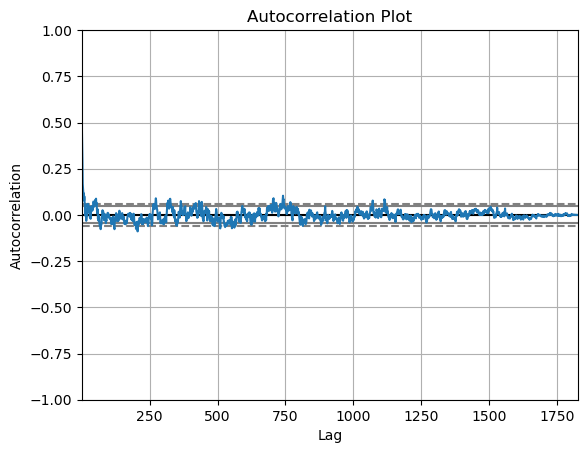

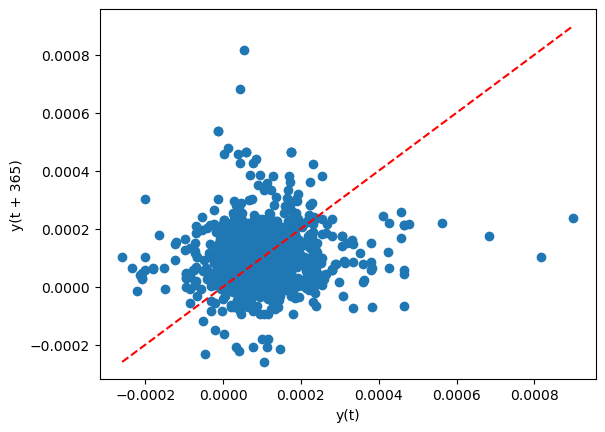

In [60]:
pd.plotting.autocorrelation_plot(mtr[['rolling_4']])
plt.title('Autocorrelation Plot')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

# Create the lag plot
lag_plot = pd.plotting.lag_plot(mtr[['rolling_4']].dropna(), lag=365)

# Add y=x line
plt.plot([mtr['rolling_4'].min(), mtr['rolling_4'].max()],
         [mtr['rolling_4'].min(), mtr['rolling_4'].max()],
         linestyle='--', color='red')

plt.show()


In [61]:
# import plotly.graph_objs as go

# #cmb.set_index('Current_Date', inplace=True)
# fig = go.Figure()
# fig.add_trace(go.Scatter(x=mtr.index, y=mtr['HCHO_reading'].fillna(0), mode='lines', name='HCHO_reading'))
# fig.add_trace(go.Scatter(x=mtr.index, y=mtr['rolling_3'], mode='lines', name='rolling_3'))
# fig.add_trace(go.Scatter(x=mtr.index, y=mtr['rolling_30'], mode='lines', name='rolling_30'))
# fig.add_trace(go.Scatter(x=mtr.index, y=mtr['HCHO_reading_filled'], mode='lines', name='HCHO_reading_filled'))
# #fig.add_trace(go.Scatter(x=cmb.index, y=cmb['rolling_30'], mode='lines', name='rolling_30'))

# # Update layout
# fig.update_layout(title='HCHO-level Data',
#                   xaxis_title='Date',
#                   yaxis_title='HCHO-level',
#                   xaxis=dict(rangeslider=dict(visible=True), type='date'))

# # Show the plot
# fig.show()

In [62]:
mtr.drop(columns=['HCHO_reading',
                  'ffill',
                  'bfill'],inplace=True)
mtr.head(15)


,Location,Next_Date,rolling_4
Current_Date,,,
2019-01-01,"Deniyaya, Matara",2019-01-02,0.000006
2019-01-02,"Deniyaya, Matara",2019-01-03,0.000006
2019-01-03,"Deniyaya, Matara",2019-01-04,0.000236
2019-01-04,"Deniyaya, Matara",2019-01-05,0.000064
2019-01-05,"Deniyaya, Matara",2019-01-06,0.000053
2019-01-06,"Deniyaya, Matara",2019-01-07,0.000132
2019-01-07,"Deniyaya, Matara",2019-01-08,0.000063
2019-01-08,"Deniyaya, Matara",2019-01-09,0.000023
2019-01-09,"Deniyaya, Matara",2019-01-10,0.000072


# Outlier Detection

Outlier number 21


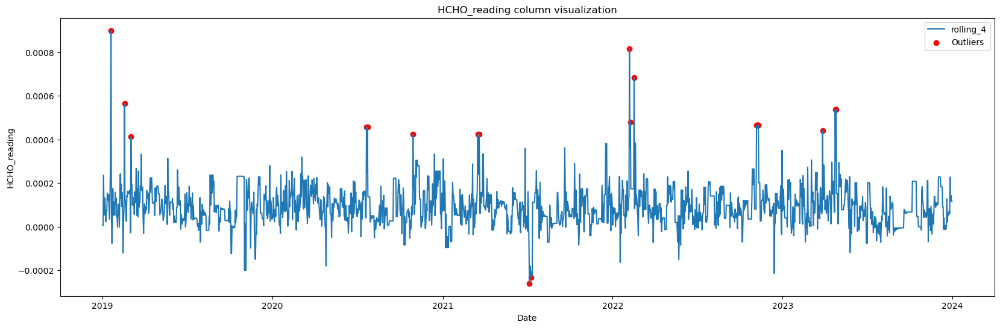

In [63]:
import numpy as np

# Calculate the first and third quartiles
Q1 = np.percentile(mtr["rolling_4"], 25)
Q3 = np.percentile(mtr["rolling_4"], 75)
IQR = Q3 - Q1

threshold = 2.5 * IQR

# Find the outliers
outliers = (mtr["rolling_4"] < Q1 - threshold) | (mtr["rolling_4"] > Q3 + threshold)
print('Outlier number',outliers.sum())

# Plot the data
plt.figure(figsize=(20, 6))
plt.plot(mtr.index, mtr["rolling_4"], label="rolling_4")
plt.scatter(mtr.index[outliers], mtr["rolling_4"][outliers], color='red', label='Outliers')
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()


In [64]:
import numpy as np
mtr['outlier_cleaned']=mtr["rolling_4"]
mtr['outlier_cleaned'][outliers]=np.nan
mtr['outlier_cleaned'].isnull().sum()

21

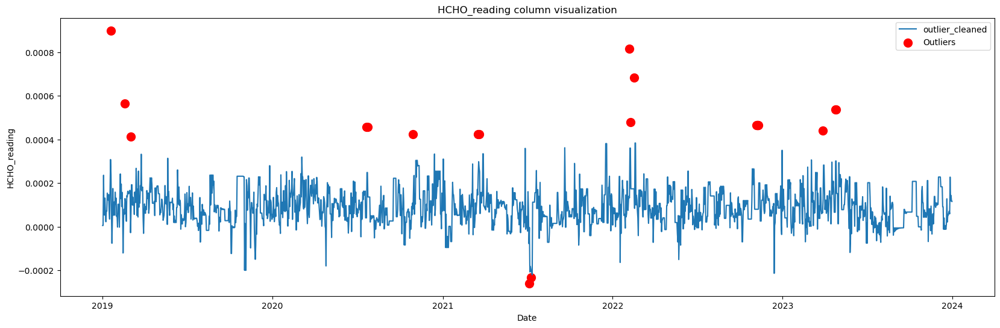

In [65]:
#Rolling window method with window size-3 on a loop untill number of null values become 0

#cmb['rolling_3']=cmb['HCHO_reading']
while (mtr['outlier_cleaned'].isnull().sum()>0):
    mtr['outlier_cleaned']=mtr['outlier_cleaned'].fillna(mtr['outlier_cleaned'].rolling(window=3, min_periods=1).mean())
plt.figure(figsize=(20, 6))
plt.plot( mtr.index, mtr["outlier_cleaned"], label="outlier_cleaned")
plt.scatter(mtr.index[outliers], mtr["rolling_4"][outliers], color='red', marker='o', s=100, label='Outliers')
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

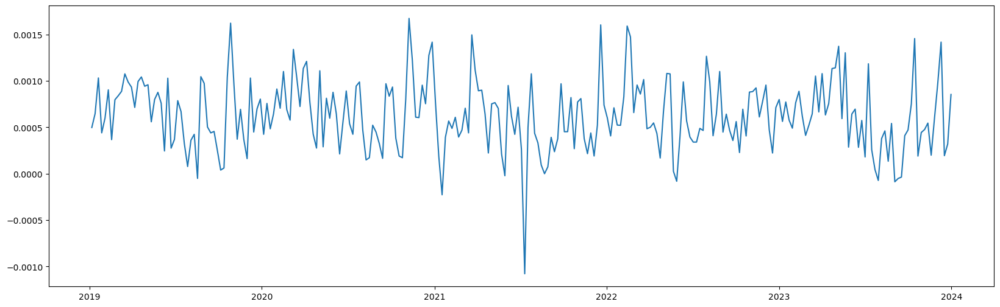

In [66]:
#cmb.groupby(cmb.index.year)

#cmb[['HCHO_reading']].resample('1w').mean()
plt.figure(figsize=(20, 6))
plt.plot(  mtr[['outlier_cleaned']].resample('1w').sum(), label="outlier_cleaned")

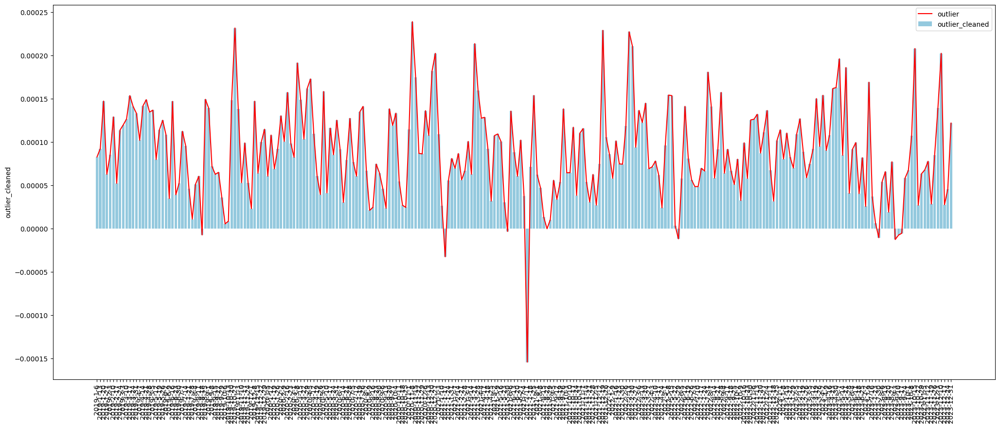

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(25, 10))
a = mtr['outlier_cleaned'].resample('1w').mean()
months = []
for i in a.index:
    months.append(f"{i.year}-{i.month}-{i.day}")

# Create the bar plot
sns.barplot(x=months, y=a, color='skyblue', label="outlier_cleaned")

# Add a line plot on top of the bar plot
sns.lineplot(x=months, y=a, color='red', label="outlier")

plt.legend()
plt.xticks(rotation=90)
plt.show()


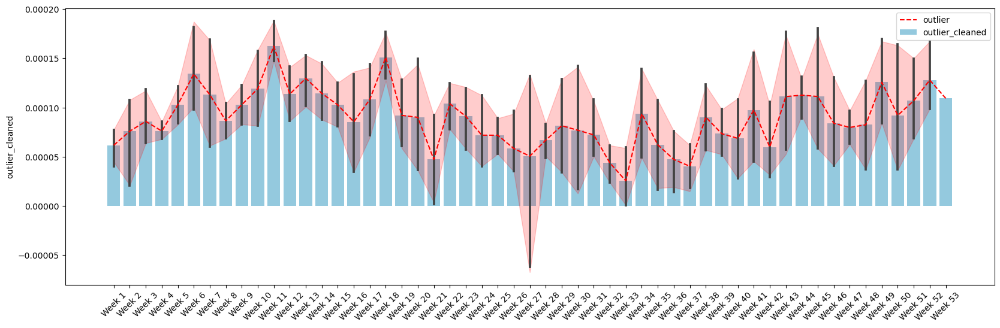

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
a = mtr['outlier_cleaned'].resample('W').mean()  # Resample by week and compute sum
weeks = []
for i in a.index:
    weeks.append(f"Week {i.week}")

# Create the bar plot with a different color
sns.barplot(x=weeks, y=a, color='skyblue', label="outlier_cleaned")

# Add a line plot on top of the bar plot with a different color
sns.lineplot(x=weeks, y=a, color='red', label="outlier", linestyle='dashed')

plt.legend()
plt.xticks(rotation=45)
plt.show()


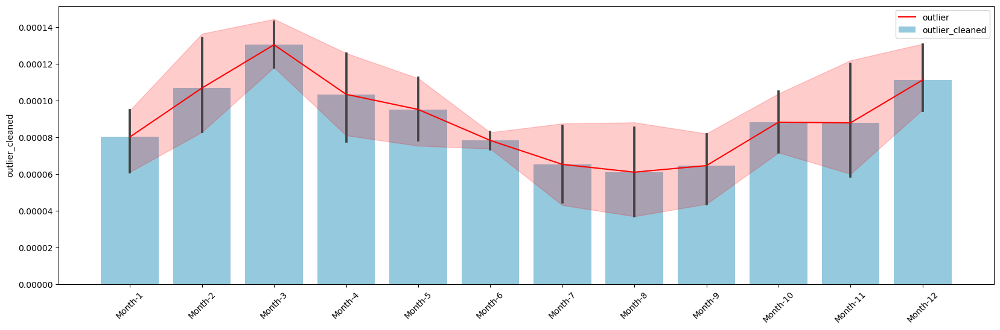

In [69]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
a = mtr['outlier_cleaned'].resample('1m').mean()
months = []
for i in a.index:
    months.append(f"Month-{i.month}")

# Create the bar plot
sns.barplot(x=months, y=a, color='skyblue', label="outlier_cleaned")

# Add a line plot on top of the bar plot
sns.lineplot(x=months, y=a, color='red', label="outlier")

plt.legend()
plt.xticks(rotation=45)
plt.show()


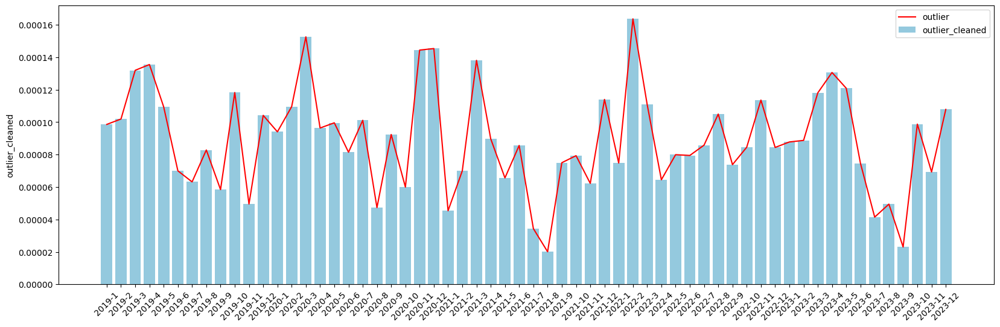

In [70]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
a = mtr['outlier_cleaned'].resample('1m').mean()
months = []
for i in a.index:
    months.append(f"{i.year}-{i.month}")

# Create the bar plot
sns.barplot(x=months, y=a, color='skyblue', label="outlier_cleaned")

# Add a line plot on top of the bar plot
sns.lineplot(x=months, y=a, color='red', label="outlier")

plt.legend()
plt.xticks(rotation=45)
plt.show()


In [71]:
a=mtr['outlier_cleaned'].resample('1w').mean()
a

Current_Date
2019-01-06    8.287864e-05
2019-01-13    9.245359e-05
2019-01-20    1.473317e-04
2019-01-27    6.285967e-05
2019-02-03    8.557083e-05
2019-02-10    1.290244e-04
2019-02-17    5.239010e-05
2019-02-24    1.138147e-04
2019-03-03    1.199209e-04
2019-03-10    1.267237e-04
2019-03-17    1.536791e-04
2019-03-24    1.410373e-04
2019-03-31    1.332240e-04
2019-04-07    1.020454e-04
2019-04-14    1.418666e-04
2019-04-21    1.489336e-04
2019-04-28    1.345854e-04
2019-05-05    1.368606e-04
2019-05-12    7.989575e-05
2019-05-19    1.141846e-04
2019-05-26    1.251947e-04
2019-06-02    1.084181e-04
2019-06-09    3.493302e-05
2019-06-16    1.469498e-04
2019-06-23    3.928618e-05
2019-06-30    5.258262e-05
2019-07-07    1.124293e-04
2019-07-14    9.563941e-05
2019-07-21    4.630702e-05
2019-07-28    1.104995e-05
2019-08-04    5.147074e-05
2019-08-11    6.054177e-05
2019-08-18   -7.242206e-06
2019-08-25    1.493454e-04
2019-09-01    1.391369e-04
2019-09-08    7.193484e-05
2019-09-15    6

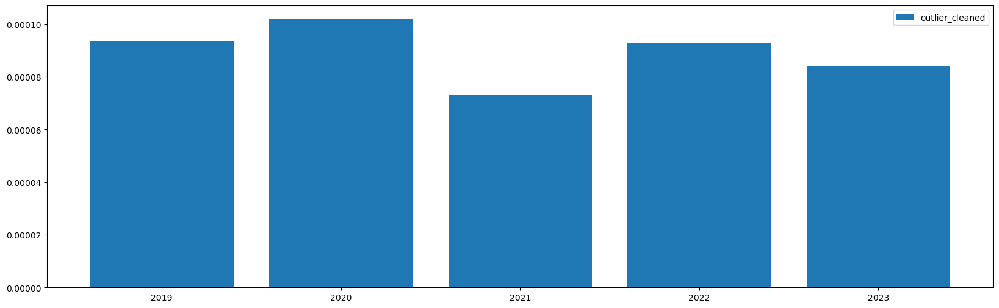

In [72]:

import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
plt.bar( mtr['outlier_cleaned'].resample('1y').mean().index.year,mtr['outlier_cleaned'].resample('1y').mean(), label="outlier_cleaned")
#plt.plot(  mtr['outlier_cleaned'].resample('1y').mean().index.year,mtr[['outlier_cleaned']].resample('1y').mean(), label="outlier_cleaned")
plt.legend()
plt.show()


In [73]:
mtr.rename(columns={'outlier_cleaned': 'HCHO_reading'}, inplace=True)
mtr.head(20)

,Location,Next_Date,rolling_4,HCHO_reading
Current_Date,,,,
2019-01-01,"Deniyaya, Matara",2019-01-02,0.000006,0.000006
2019-01-02,"Deniyaya, Matara",2019-01-03,0.000006,0.000006
2019-01-03,"Deniyaya, Matara",2019-01-04,0.000236,0.000236
2019-01-04,"Deniyaya, Matara",2019-01-05,0.000064,0.000064
2019-01-05,"Deniyaya, Matara",2019-01-06,0.000053,0.000053
2019-01-06,"Deniyaya, Matara",2019-01-07,0.000132,0.000132
2019-01-07,"Deniyaya, Matara",2019-01-08,0.000063,0.000063
2019-01-08,"Deniyaya, Matara",2019-01-09,0.000023,0.000023
2019-01-09,"Deniyaya, Matara",2019-01-10,0.000072,0.000072


# Nuwara eliya

In [74]:
ne.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1826 entries, 3652 to 5477
Data columns (total 4 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   HCHO_reading  741 non-null    float64       
 1   Location      1826 non-null   object        
 2   Current_Date  1826 non-null   datetime64[ns]
 3   Next_Date     1826 non-null   datetime64[ns]
dtypes: datetime64[ns](2), float64(1), object(1)
memory usage: 71.3+ KB


In [75]:
ne.describe()

,HCHO_reading,Current_Date,Next_Date
count,741.000000,1826,1826
mean,0.000088,2021-07-01 12:00:00,2021-07-02 12:00:00.000000256
min,-0.000179,2019-01-01 00:00:00,2019-01-02 00:00:00
25%,0.000034,2020-04-01 06:00:00,2020-04-02 06:00:00
50%,0.000082,2021-07-01 12:00:00,2021-07-02 12:00:00
75%,0.000136,2022-09-30 18:00:00,2022-10-01 18:00:00
max,0.000419,2023-12-31 00:00:00,2024-01-01 00:00:00
std,0.000084,NaN,NaN


In [76]:
# Step 1: Check Time Range
min_date = ne['Current_Date'].min()
max_date = ne['Current_Date'].max()
print("Time Range: From", min_date, "to", max_date)

# Step 2: Generate Time Range
complete_time_range = pd.date_range(start=min_date, end=max_date, freq='D')  
# Step 3: Identify Missing Values
missing_values = complete_time_range[~complete_time_range.isin(ne['Current_Date'])]

if len(missing_values) == 0:
    print("No missing values found in the time range.")
else:
    print("Missing values found:")
    print(missing_values)

Time Range: From 2019-01-01 00:00:00 to 2023-12-31 00:00:00
No missing values found in the time range.


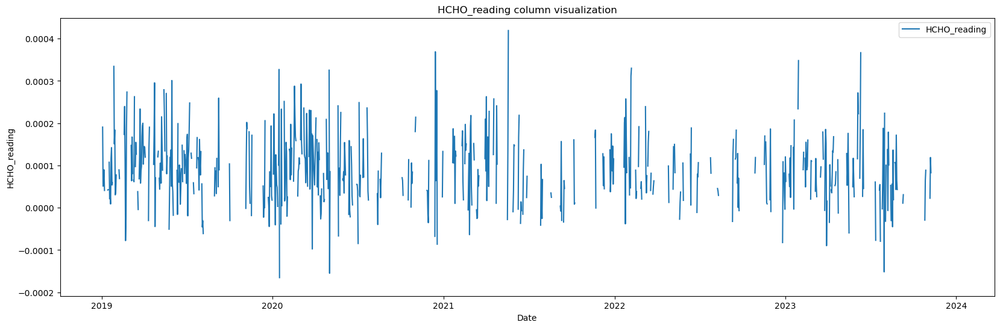

In [77]:
import matplotlib.pyplot as plt

# Create the plot
plt.figure(figsize=(20, 6))
plt.plot( ne["Current_Date"], ne["HCHO_reading"], label="HCHO_reading")
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

In [78]:
ne.set_index('Current_Date', inplace=True)
fig = go.Figure()


fig.add_trace(go.Scatter(x=ne.index, y=ne['HCHO_reading'], mode='lines', name='HCHO_reading'))

# Update layout
fig.update_layout(title='HCHO-level Data',
                  xaxis_title='Date',
                  yaxis_title='HCHO-level',
                  xaxis=dict(rangeslider=dict(visible=True), type='date'))

# Show the plot
fig.show()

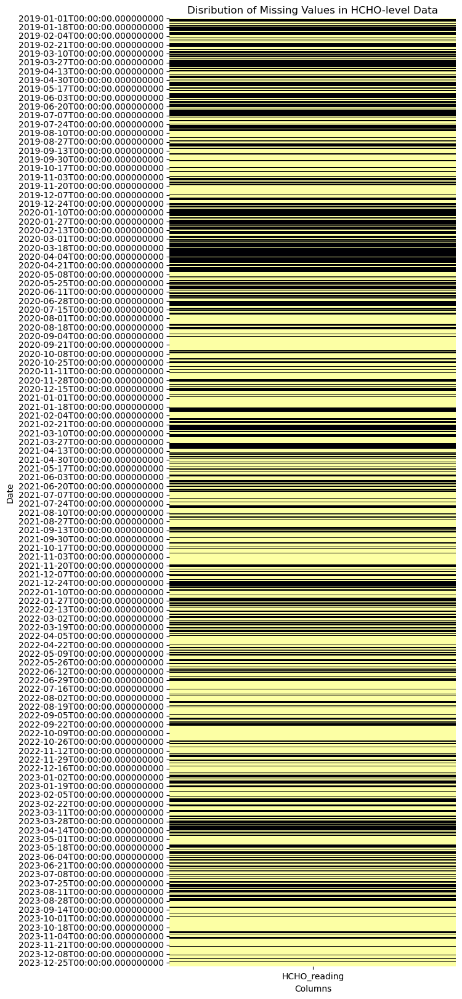

In [79]:
import seaborn as sns

# Visualize missing values using a heatmap
plt.figure(figsize=(6, 20))
sns.heatmap(ne[['HCHO_reading']].isnull(), cbar=False, cmap='inferno')
plt.title('Disribution of Missing Values in HCHO-level Data')
plt.xlabel('Columns')
plt.ylabel('Date')
plt.show()

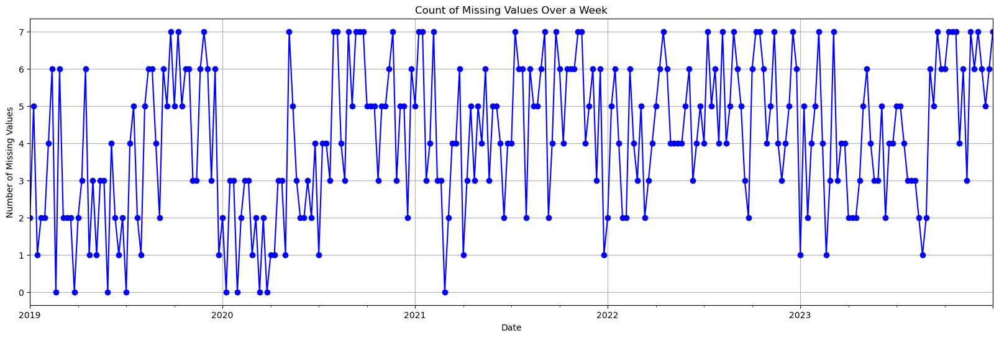

In [80]:
frequency = 'W'

missing_counts = ne[['HCHO_reading']].isnull().sum(axis=1).resample(frequency).sum()
# Plot the count of missing values over time
plt.figure(figsize=(20, 6))
missing_counts.plot(color='blue', marker='o', linestyle='-')
plt.title('Count of Missing Values Over a Week')
plt.xlabel('Date')
plt.ylabel('Number of Missing Values')
plt.grid(True)
plt.show()

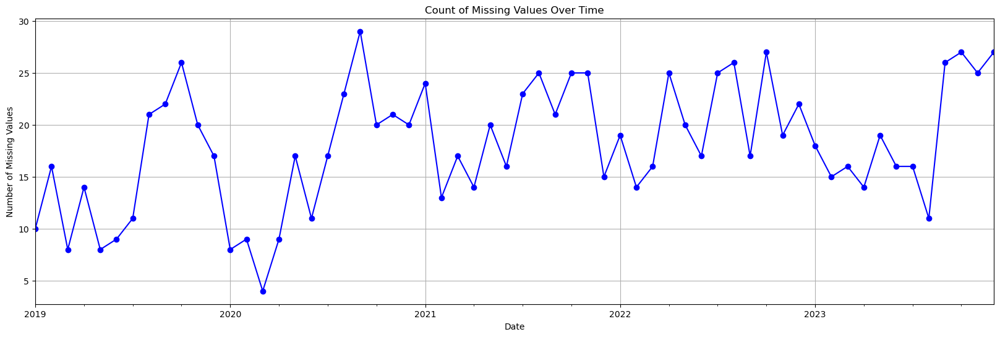

In [81]:
frequency = 'M'

missing_counts = ne[['HCHO_reading']].isnull().sum(axis=1).resample(frequency).sum()
# Plot the count of missing values over time
plt.figure(figsize=(20, 6))
missing_counts.plot(color='blue', marker='o', linestyle='-')
plt.title('Count of Missing Values Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Missing Values')
plt.grid(True)
plt.show()

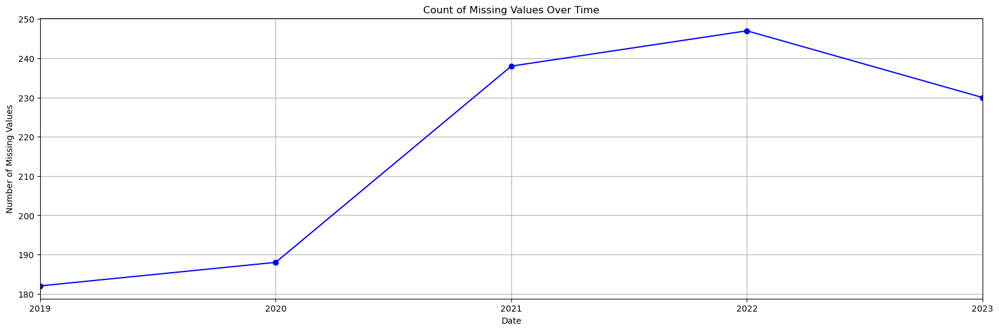

In [82]:
frequency = 'Y'

missing_counts = ne[['HCHO_reading']].isnull().sum(axis=1).resample(frequency).sum()
# Plot the count of missing values over time
plt.figure(figsize=(20, 6))
missing_counts.plot(color='blue', marker='o', linestyle='-')
plt.title('Count of Missing Values Over Time')
plt.xlabel('Date')
plt.ylabel('Number of Missing Values')
plt.grid(True)
plt.show()

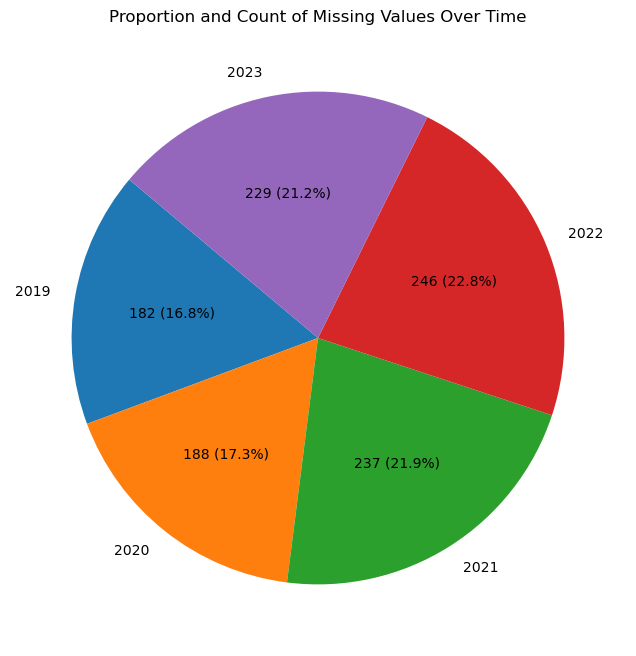

In [83]:
frequency = 'Y'

missing_counts = ne[['HCHO_reading']].isnull().sum(axis=1).resample(frequency).sum()

# Create a pie chart
plt.figure(figsize=(8, 8))
plt.pie(missing_counts, labels=missing_counts.index.year, autopct=lambda p: f'{int(p * sum(missing_counts)/100)} ({p:.1f}%)', startangle=140)
plt.title('Proportion and Count of Missing Values Over Time')
plt.show()


Previous: 1085
After: 602


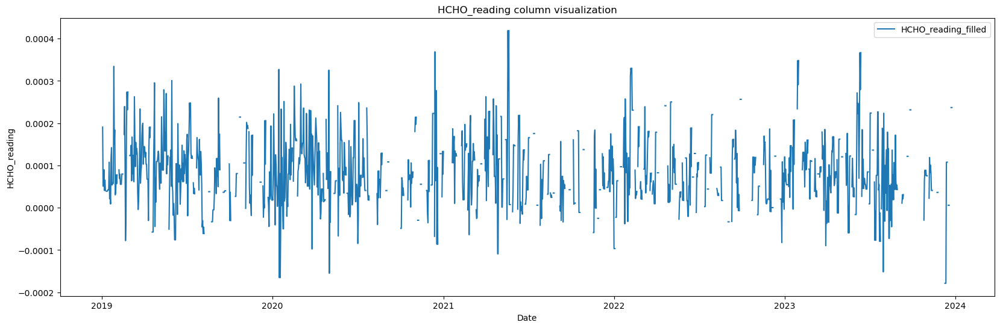

In [84]:
# Create a new column for the filled values
ne['HCHO_reading_filled'] = ne['HCHO_reading']
ne['HCHO_reading_filled']=ne['HCHO_reading_filled'].fillna(ne['HCHO_reading_filled'].rolling(window=3, min_periods=1).mean())
print('Previous:', ne['HCHO_reading'].isnull().sum())
print('After:' ,ne['HCHO_reading_filled'].isnull().sum())

plt.figure(figsize=(20, 6))
plt.plot(ne.index, ne['HCHO_reading_filled'], label='HCHO_reading_filled')
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

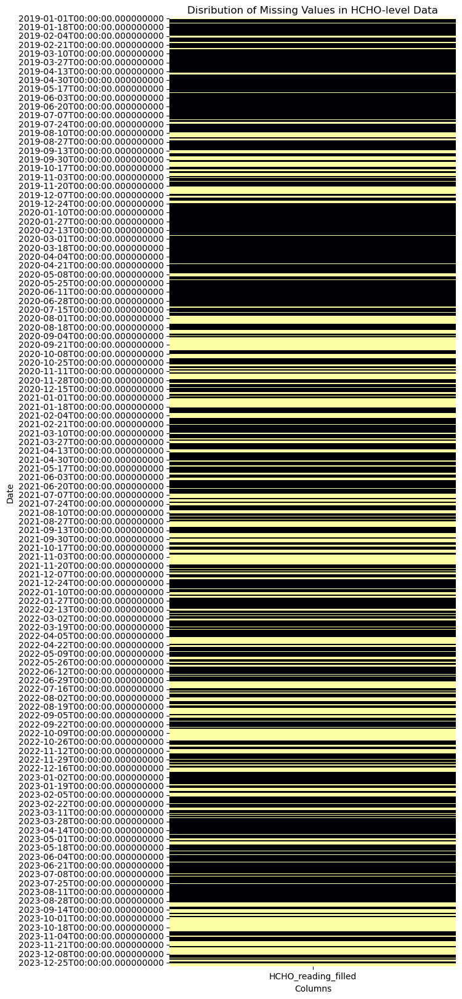

In [85]:
# Visualize missing values using a heatmap
plt.figure(figsize=(6, 20))
sns.heatmap(ne[['HCHO_reading_filled']].isnull(), cbar=False, cmap='inferno')
plt.title('Disribution of Missing Values in HCHO-level Data')
plt.xlabel('Columns')
plt.ylabel('Date')
plt.show()

Previous: 1085
After: 295


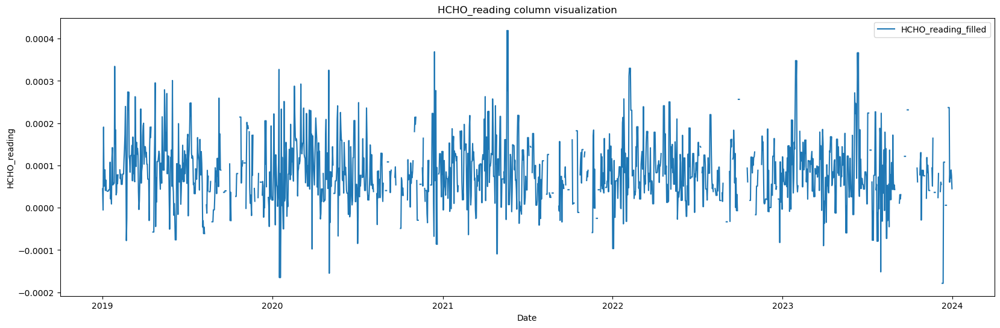

In [86]:

# Assuming 'mtr' is your DataFrame with a DateTimeIndex
# Assuming 'HCHO_reading' is the column with null values

# Define the time range
start_date = '2019-01-01'
end_date = '2024-01-01'

# Generate a DataFrame with the range of dates
date_range = pd.date_range(start=start_date, end=end_date, freq='D')



# Iterate over each null value
for index, row in ne[ne['HCHO_reading_filled'].isnull()].iterrows():
    # Get the date of the null value
    null_date = row.name
    
    # Extract the month and day of the null date
    month_day = (null_date.month, null_date.day)
    
    # Filter the DataFrame to include only rows with the same month and day
    same_day_rows = ne[(ne.index.month == month_day[0]) & (ne.index.day == month_day[1])]
    
    if same_day_rows['HCHO_reading_filled'].isnull().sum()<3:
    
        # Exclude the null value itself
        same_day_rows = same_day_rows[same_day_rows.index != null_date]

        # Calculate the mean of the non-null values for the same day across years
        mean_value = same_day_rows['HCHO_reading_filled'].mean()

        # Fill the null value with the mean
        ne.at[null_date, 'HCHO_reading_filled'] = mean_value
        
print('Previous:', ne['HCHO_reading'].isnull().sum())
print('After:' ,ne['HCHO_reading_filled'].isnull().sum())

# Display the DataFrame with the filled values
plt.figure(figsize=(20, 6))
plt.plot(ne.index, ne['HCHO_reading_filled'], label='HCHO_reading_filled')
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

Previous: 1085
After: 49


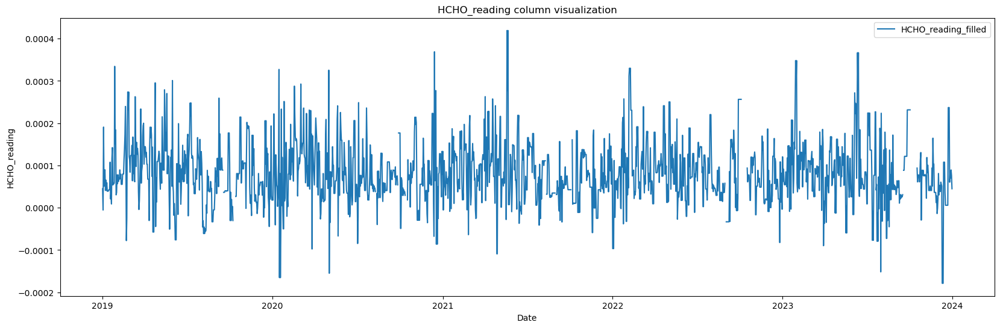

In [87]:
ne['HCHO_reading_filled']=ne['HCHO_reading_filled'].fillna(ne['HCHO_reading_filled'].rolling(window=5, min_periods=1).mean())
print('Previous:', ne['HCHO_reading'].isnull().sum())
print('After:' ,ne['HCHO_reading_filled'].isnull().sum())

plt.figure(figsize=(20, 6))
plt.plot(ne.index, ne['HCHO_reading_filled'], label='HCHO_reading_filled')
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

Previous: 1085
After: 31


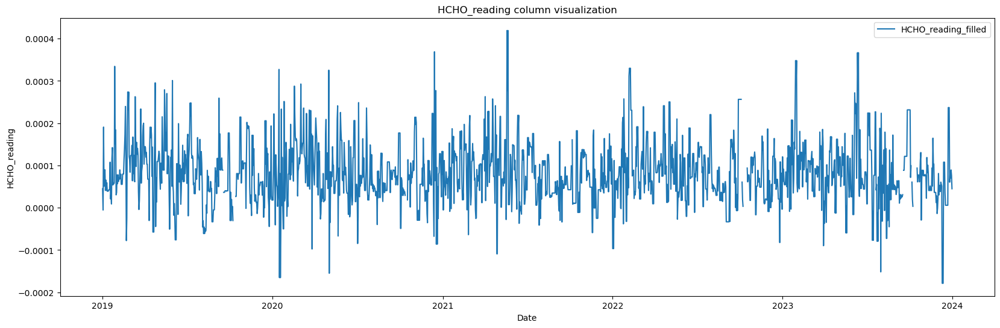

In [88]:

# Assuming 'mtr' is your DataFrame with a DateTimeIndex
# Assuming 'HCHO_reading' is the column with null values

# Define the time range
start_date = '2019-01-01'
end_date = '2024-01-01'

# Generate a DataFrame with the range of dates
date_range = pd.date_range(start=start_date, end=end_date, freq='D')



# Iterate over each null value
for index, row in ne[ne['HCHO_reading_filled'].isnull()].iterrows():
    # Get the date of the null value
    null_date = row.name
    
    # Extract the month and day of the null date
    month_day = (null_date.month, null_date.day)
    
    # Filter the DataFrame to include only rows with the same month and day
    same_day_rows = ne[(ne.index.month == month_day[0]) & (ne.index.day == month_day[1])]
    
    if same_day_rows['HCHO_reading_filled'].isnull().sum()<3:
    
        # Exclude the null value itself
        same_day_rows = same_day_rows[same_day_rows.index != null_date]

        # Calculate the mean of the non-null values for the same day across years
        mean_value = same_day_rows['HCHO_reading_filled'].mean()

        # Fill the null value with the mean
        ne.at[null_date, 'HCHO_reading_filled'] = mean_value
        
print('Previous:', ne['HCHO_reading'].isnull().sum())
print('After:' ,ne['HCHO_reading_filled'].isnull().sum())

# Display the DataFrame with the filled values
plt.figure(figsize=(20, 6))
plt.plot(ne.index, ne['HCHO_reading_filled'], label='HCHO_reading_filled')
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

Previous: 1085
After: 17


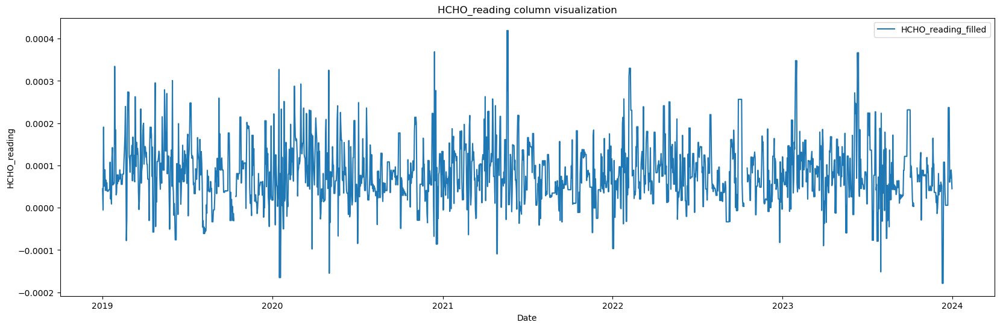

In [89]:
ne['HCHO_reading_filled']=ne['HCHO_reading_filled'].fillna(ne['HCHO_reading_filled'].rolling(window=3, min_periods=1).mean())
print('Previous:', ne['HCHO_reading'].isnull().sum())
print('After:' ,ne['HCHO_reading_filled'].isnull().sum())

plt.figure(figsize=(20, 6))
plt.plot(ne.index, ne['HCHO_reading_filled'], label='HCHO_reading_filled')
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

Previous: 1085
After: 9


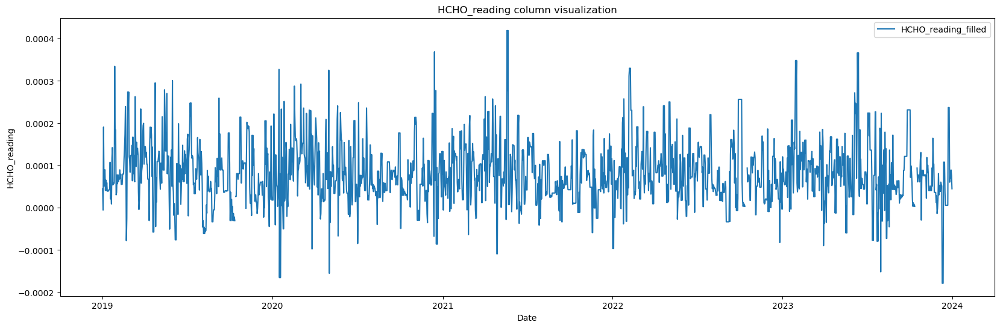

In [90]:
ne['HCHO_reading_filled']=ne['HCHO_reading_filled'].fillna(ne['HCHO_reading_filled'].rolling(window=3, min_periods=1).mean())
print('Previous:', ne['HCHO_reading'].isnull().sum())
print('After:' ,ne['HCHO_reading_filled'].isnull().sum())

plt.figure(figsize=(20, 6))
plt.plot(ne.index, ne['HCHO_reading_filled'], label='HCHO_reading_filled')
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

Previous: 1085
After: 0


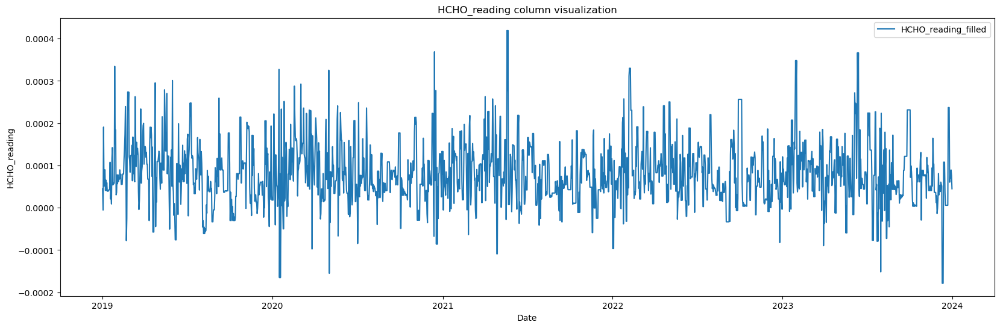

In [91]:
ne['HCHO_reading_filled']=ne['HCHO_reading_filled'].fillna(ne['HCHO_reading_filled'].rolling(window=5, min_periods=1).mean())
print('Previous:', ne['HCHO_reading'].isnull().sum())
print('After:' ,ne['HCHO_reading_filled'].isnull().sum())

plt.figure(figsize=(20, 6))
plt.plot(ne.index, ne['HCHO_reading_filled'], label='HCHO_reading_filled')
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

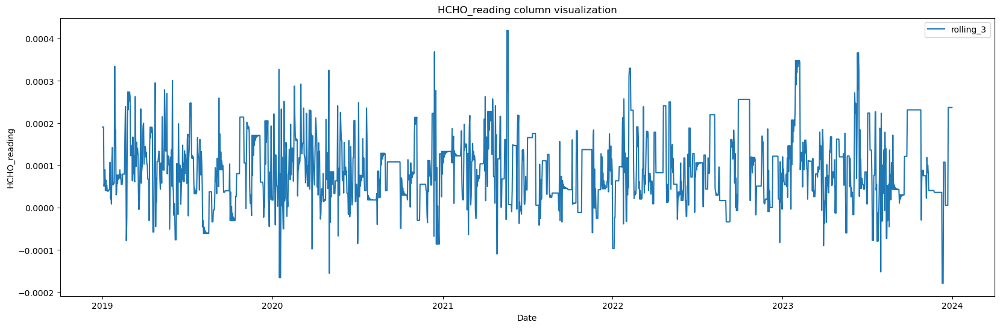

num of iterations,  15


In [92]:
size=3
ne[f'rolling_{size}']=ne['HCHO_reading']
num=0
while (ne[f'rolling_{size}'].isnull().sum()>2):
    num+=1
    ne[f'rolling_{size}']=ne[f'rolling_{size}'].fillna(ne[f'rolling_{size}'].rolling(window=size, min_periods=1).mean())
ne[f'rolling_{size}']=ne[f'rolling_{size}'].fillna(method='bfill')
plt.figure(figsize=(20, 6))
plt.plot( ne.index, ne[f"rolling_{size}"], label=f"rolling_{size}")
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()
print('num of iterations, ',num)

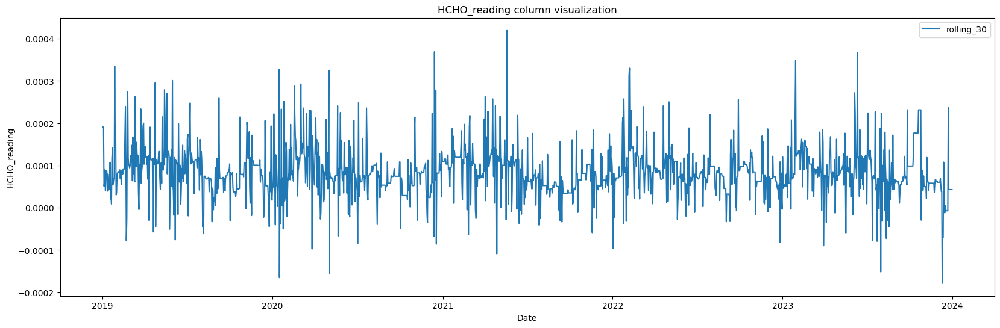

num of iterations,  1


In [93]:
size=30
ne[f'rolling_{size}']=ne['HCHO_reading']
num=0
while (ne[f'rolling_{size}'].isnull().sum()>2):
    num+=1
    ne[f'rolling_{size}']=ne[f'rolling_{size}'].fillna(ne[f'rolling_{size}'].rolling(window=size, min_periods=1).mean())
ne[f'rolling_{size}']=ne[f'rolling_{size}'].fillna(method='bfill')
plt.figure(figsize=(20, 6))
plt.plot( ne.index, ne[f"rolling_{size}"], label=f"rolling_{size}")
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()
print('num of iterations, ',num)

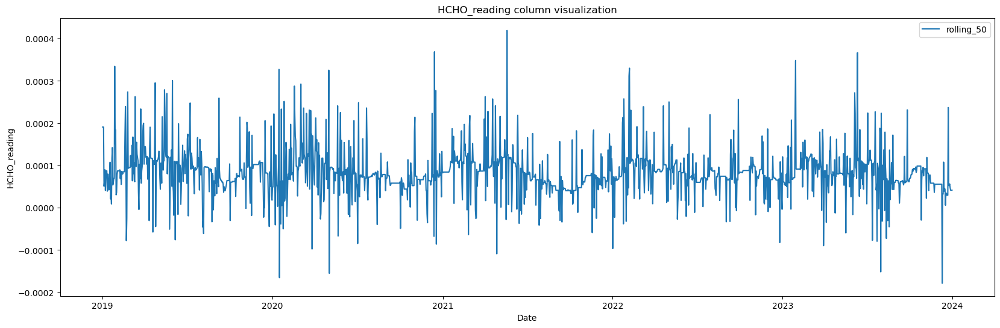

num of iterations,  1


In [94]:
size=50
ne[f'rolling_{size}']=ne['HCHO_reading']
num=0
while (ne[f'rolling_{size}'].isnull().sum()>2):
    num+=1
    ne[f'rolling_{size}']=ne[f'rolling_{size}'].fillna(ne[f'rolling_{size}'].rolling(window=size, min_periods=1).mean())
ne[f'rolling_{size}']=ne[f'rolling_{size}'].fillna(method='bfill')
plt.figure(figsize=(20, 6))
plt.plot( ne.index, ne[f"rolling_{size}"], label=f"rolling_{size}")
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()
print('num of iterations, ',num)

# Interpolate

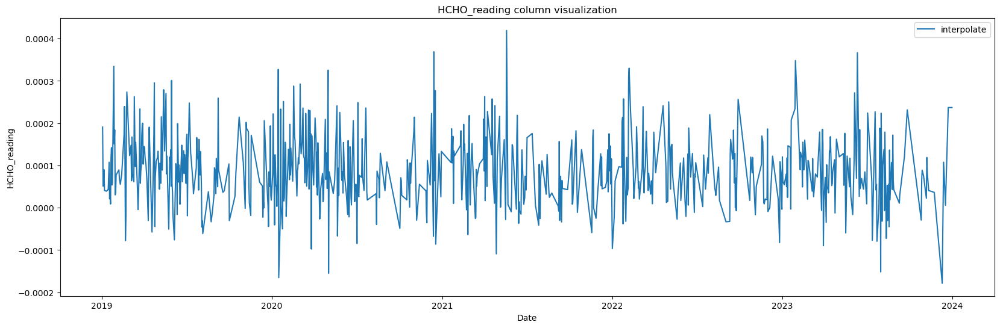

In [95]:
#Spline interpolation
ne['linear_interpolate']=ne['HCHO_reading'].interpolate(method='linear')
plt.figure(figsize=(20, 6))
plt.plot( ne.index, ne["linear_interpolate"], label="interpolate")
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()

# Outlier 

Outlier number 25


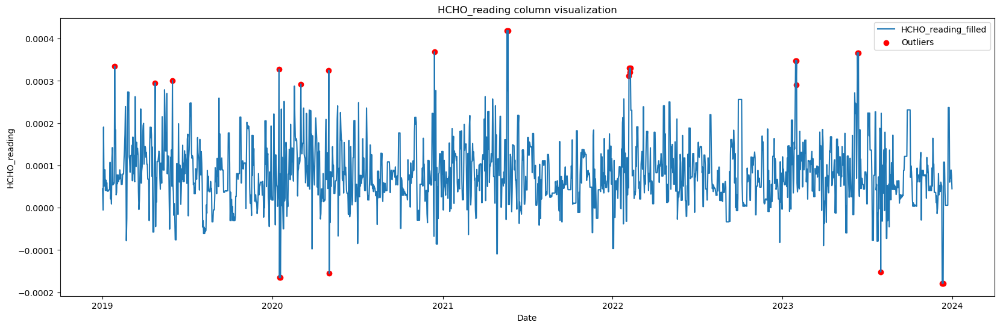

In [96]:
import numpy as np

# Calculate the first and third quartiles
Q1 = np.percentile(ne["HCHO_reading_filled"], 25)
Q3 = np.percentile(ne["HCHO_reading_filled"], 75)
IQR = Q3 - Q1

threshold = 2 * IQR

# Find the outliers
outliers = (ne["HCHO_reading_filled"] < Q1 - threshold) | (ne["HCHO_reading_filled"] > Q3 + threshold)
print('Outlier number',outliers.sum())

# Plot the data
plt.figure(figsize=(20, 6))
plt.plot(ne.index, ne["HCHO_reading_filled"], label="HCHO_reading_filled")
plt.scatter(ne.index[outliers], ne["HCHO_reading_filled"][outliers], color='red', label='Outliers')
plt.title("HCHO_reading column visualization")
plt.xlabel("Date")
plt.ylabel("HCHO_reading")
plt.legend()
plt.show()


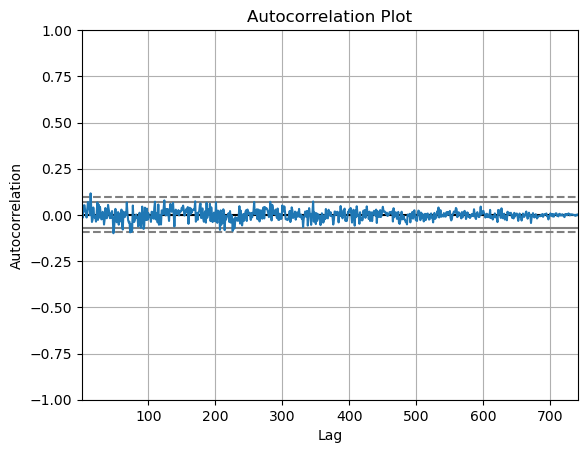

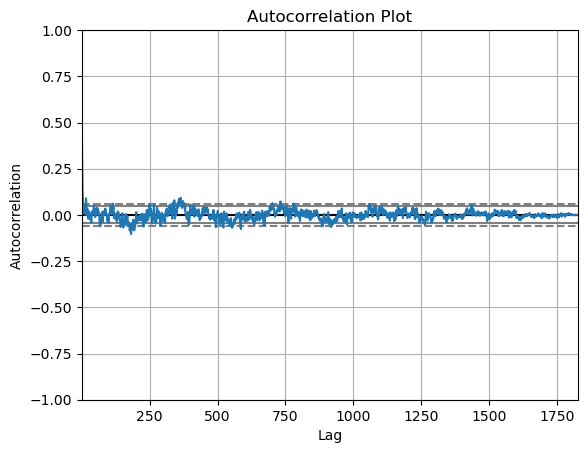

In [97]:
pd.plotting.autocorrelation_plot(ne[['HCHO_reading']].dropna())
plt.title('Autocorrelation Plot')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

pd.plotting.autocorrelation_plot(ne[['HCHO_reading_filled']])
plt.title('Autocorrelation Plot')
plt.xlabel('Lag')
plt.ylabel('Autocorrelation')
plt.show()

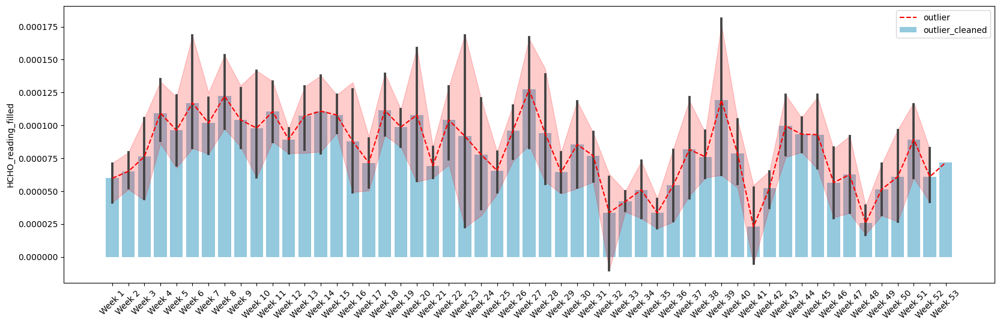

In [98]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
a = ne['HCHO_reading_filled'].resample('W').mean()  # Resample by week and compute sum
weeks = []
for i in a.index:
    weeks.append(f"Week {i.week}")

# Create the bar plot with a different color
sns.barplot(x=weeks, y=a, color='skyblue', label="outlier_cleaned")

# Add a line plot on top of the bar plot with a different color
sns.lineplot(x=weeks, y=a, color='red', label="outlier", linestyle='dashed')

plt.legend()
plt.xticks(rotation=45)
plt.show()


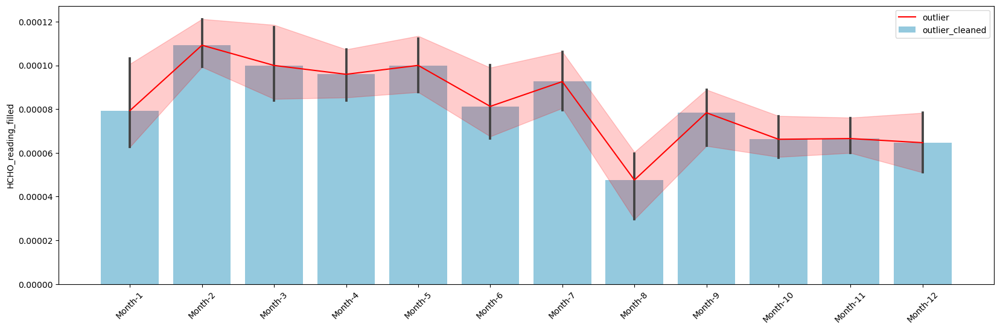

In [99]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
a = ne['HCHO_reading_filled'].resample('1m').mean()
months = []
for i in a.index:
    months.append(f"Month-{i.month}")

# Create the bar plot
sns.barplot(x=months, y=a, color='skyblue', label="outlier_cleaned")

# Add a line plot on top of the bar plot
sns.lineplot(x=months, y=a, color='red', label="outlier")

plt.legend()
plt.xticks(rotation=45)
plt.show()


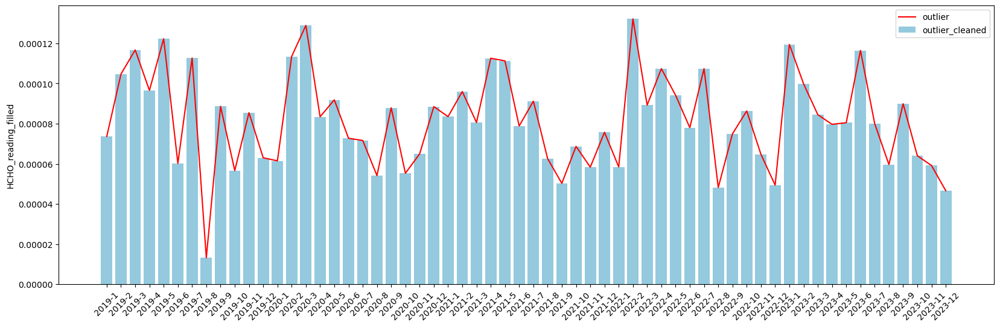

In [100]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
a = ne['HCHO_reading_filled'].resample('1m').mean()
months = []
for i in a.index:
    months.append(f"{i.year}-{i.month}")

# Create the bar plot
sns.barplot(x=months, y=a, color='skyblue', label="outlier_cleaned")

# Add a line plot on top of the bar plot
sns.lineplot(x=months, y=a, color='red', label="outlier")

plt.legend()
plt.xticks(rotation=45)
plt.show()


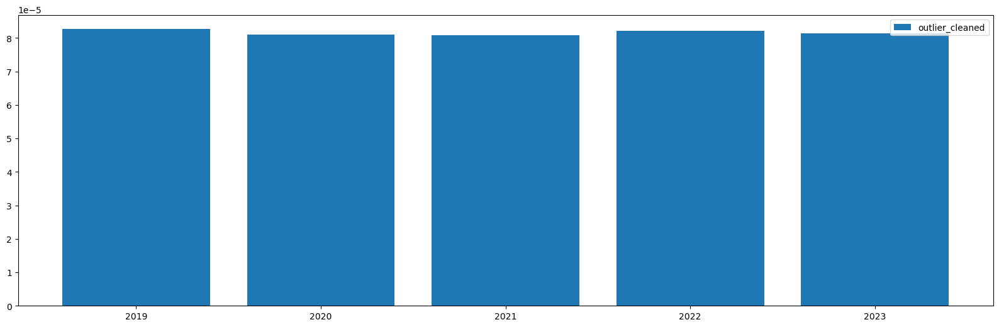

In [101]:

import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
plt.bar( ne['HCHO_reading_filled'].resample('1y').mean().index.year,ne['HCHO_reading_filled'].resample('1y').mean(), label="outlier_cleaned")
#plt.plot(  mtr['outlier_cleaned'].resample('1y').mean().index.year,mtr[['outlier_cleaned']].resample('1y').mean(), label="outlier_cleaned")
plt.legend()
plt.show()


# Bibile